# AI-Generated vs. Real Image Classification

## Machine Learning Assignment — Computer Vision

In this project, we solve a binary image classification problem: identifying whether an image is real or AI-generated.

The dataset contains two main classes:
- AI-generated images
- Real images

Each class is divided into five visual categories:
- animals
- city
- food
- nature
- people

Our goal is to build a complete supervised learning pipeline:
1. Load the dataset
2. Analyze the class distribution
3. Handle data imbalance
4. Split the data into train and test sets
5. Extract image features
6. Implement a KNN classifier from scratch
7. Evaluate the model using Macro F1 score

## Student Details

Student 1: Leonid M. - 4484

Student 2: Or T. - 1266  

Student 3: Shlomi H. - 1007

## AI Tools and External Help

During this assignment, we used an AI chatbot as a supporting tool for planning the project structure, improving explanations, and understanding how to organize the machine learning pipeline.

Main uses:
- Understanding how to structure the notebook
- Planning the dataset preprocessing steps
- Explaining the logic of undersampling and train/test splitting
- Improving code comments and markdown explanations

The final implementation, results, and explanations were reviewed and understood by the project members.

## 1. Dataset Upload and Extraction
In this section, we upload the dataset ZIP file to Google Colab, verify that the file exists and is a valid ZIP file, and then extract it into the `/content/dataset` directory.

This step is important because the rest of the project depends on having a clear and consistent folder structure.

### *Dataset Accessibility

Google Colab uses a temporary `/content` directory, so files uploaded manually are deleted when the runtime restarts.

To make this notebook reproducible for the course staff, the dataset ZIP file is stored in a shared Google Drive link with viewing permission for anyone with the link.

The official dataset source is Kaggle:
https://www.kaggle.com/datasets/rhythmghai/ai-vs-real-images-dataset

### 1.1 Verifying the ZIP File

Before extracting the dataset, we check:
- whether the file exists
- its size in MB
- whether Python recognizes it as a valid ZIP file

This prevents errors caused by incomplete or corrupted uploads.

In [1]:
from pathlib import Path
import zipfile
import gdown

# Shared Google Drive folder URL that contains the dataset ZIP file
folder_url = "https://drive.google.com/drive/folders/1KT5OYsk5a_X_ADayG4EvroLwn__HgO0C?usp=sharing"

# Folder inside Colab where the shared Drive folder will be downloaded
download_folder = Path("/content/shared_dataset")

# Remove old downloaded folder if it exists
!rm -rf /content/shared_dataset

# Download the entire shared Google Drive folder
gdown.download_folder(
    url=folder_url,
    output=str(download_folder),
    quiet=False,
    use_cookies=False
)

# Search for ZIP files inside the downloaded folder
zip_files = sorted(download_folder.rglob("*.zip"))

print("ZIP files found:")
for file in zip_files:
    print(file)

# Use the first ZIP file found
zip_path = zip_files[0]

print("\n")

# Check whether the file exists in the Colab environment
print("Exists:", zip_path.exists())

# Print the file size in MB to verify that the download was completed
print("Size in MB:", zip_path.stat().st_size / (1024 * 1024))

# Check whether the file is a valid ZIP file before extraction
print("Is valid zip:", zipfile.is_zipfile(zip_path))

Retrieving folder contents


Processing file 1_FzgGMvlU7LH--CG49bFpGAe3ajJKqrI AI _VS_Real_Images.ipynb
Processing file 1hvNKquw1bktYucslDHliPf5B8vx3GmhD dataset_fixed.zip


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1_FzgGMvlU7LH--CG49bFpGAe3ajJKqrI
To: /content/shared_dataset/AI _VS_Real_Images.ipynb
100%|██████████| 6.84M/6.84M [00:00<00:00, 18.9MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1hvNKquw1bktYucslDHliPf5B8vx3GmhD
From (redirected): https://drive.google.com/uc?id=1hvNKquw1bktYucslDHliPf5B8vx3GmhD&confirm=t&uuid=34f015f3-20a2-408b-a677-a016062efd4d
To: /content/shared_dataset/dataset_fixed.zip
100%|██████████| 249M/249M [00:05<00:00, 43.5MB/s]

ZIP files found:
/content/shared_dataset/dataset_fixed.zip


Exists: True
Size in MB: 237.72720432281494
Is valid zip: True



Download completed


In [2]:
# Destination folder for the extracted dataset
extract_path = Path("/content/dataset")

# Remove old extracted dataset folder if it exists
!rm -rf /content/dataset

# Create a clean dataset folder
!mkdir -p /content/dataset

# Extract the ZIP file
with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_path)

# Remove macOS metadata folder if it exists
!rm -rf /content/dataset/__MACOSX

print("Dataset extracted successfully!")
print("macOS metadata folder removed if it existed.")

Dataset extracted successfully!
macOS metadata folder removed if it existed.


In [3]:
!find /content/dataset -maxdepth 3 -type d

/content/dataset
/content/dataset/Ai_generated_dataset
/content/dataset/Ai_generated_dataset/people
/content/dataset/Ai_generated_dataset/animals
/content/dataset/Ai_generated_dataset/city
/content/dataset/Ai_generated_dataset/nature
/content/dataset/Ai_generated_dataset/food
/content/dataset/real_dataset
/content/dataset/real_dataset/people
/content/dataset/real_dataset/animals
/content/dataset/real_dataset/city
/content/dataset/real_dataset/nature
/content/dataset/real_dataset/food


In [4]:
!find /content/dataset -type f | wc -l

997


## 2. Converting the Dataset into a DataFrame

The dataset is stored in folders, where each main folder represents the class label and each subfolder represents the image category.

To make the dataset easier to process, we convert the folder structure into a Pandas DataFrame.

Each row in the DataFrame represents one image and contains:
- `filepath`: the full path to the image file
- `label`: the target class, either `AI` or `Real`
- `category`: the image category, such as animals, city, food, nature, or people

This format allows us to easily analyze, balance, split, and process the dataset.

In [5]:
from pathlib import Path
import pandas as pd

# Main path where the dataset was extracted
DATASET_PATH = Path("/content/dataset")

# This list will store one dictionary per image
records = []

# Mapping between folder names and class labels
classes = {
    "Ai_generated_dataset": "AI",
    "real_dataset": "Real"
}

# Supported image file extensions
valid_extensions = [".jpg", ".jpeg", ".png", ".webp"]

# Loop over the two main folders in a fixed order
for folder_name, label in classes.items():
    class_path = DATASET_PATH / folder_name

    # Loop over category folders in sorted order
    for category_path in sorted(class_path.iterdir()):
        if category_path.is_dir():
            category = category_path.name

            # Loop over image files in sorted order
            for img_path in sorted(category_path.iterdir()):
                if img_path.is_file() and img_path.suffix.lower() in valid_extensions:
                    records.append({
                        "filepath": str(img_path),
                        "label": label,
                        "category": category
                    })

# Convert the list of records into a Pandas DataFrame
df = pd.DataFrame(records)

# Extra safety: sort the DataFrame explicitly
df = df.sort_values(
    by=["label", "category", "filepath"]
).reset_index(drop=True)

print("Total valid images:", len(df))

df.head()

Total valid images: 995


,filepath,label,category
0,/content/dataset/Ai_generated_dataset/animals/...,AI,animals
1,/content/dataset/Ai_generated_dataset/animals/...,AI,animals
2,/content/dataset/Ai_generated_dataset/animals/...,AI,animals
3,/content/dataset/Ai_generated_dataset/animals/...,AI,animals
4,/content/dataset/Ai_generated_dataset/animals/...,AI,animals


### 2.1 Dataset Distribution Analysis

Before training a model, we analyze the number of images in each class and category.

This helps us understand whether the dataset is balanced or imbalanced.
A balanced dataset is important because a model trained on an imbalanced dataset may become biased toward the majority class.

In [6]:
df.groupby(["label", "category"]).size().unstack(fill_value=0)

category,animals,city,food,nature,people
label,,,,,
AI,50,50,50,50,50
Real,148,150,150,150,147


The following output shows the total number of images in each class.

In [7]:
df["label"].value_counts()

,count
label,
Real,745
AI,250


## 3. Handling Data Imbalance Using Undersampling

The original dataset is imbalanced:
- 250 AI-generated images
- 745 real images

If we train a classifier directly on this data, the model may become biased toward the majority class, which is `Real`.

For example, a model could classify many images as `Real` simply because this class appears more often in the training data.

To reduce this bias, we apply **undersampling** to the Real class.

Since the AI class contains exactly 50 images in each category, we randomly select 50 real images from each category as well.

After undersampling:
- AI images: 250
- Real images: 250
- Total images: 500

This creates a balanced dataset while preserving the five image categories.

In [8]:
RANDOM_STATE = 42

# Keep all AI-generated images because this is the minority class
ai_df = df[df["label"] == "AI"]

# For the Real class, randomly select 50 images from each category.
# This makes the number of Real images equal to the number of AI images per category.
real_balanced_df = (
    df[df["label"] == "Real"]
    .groupby("category", group_keys=False)
    .sample(n=50, random_state=RANDOM_STATE)
)

# Combine all AI images with the selected Real images
balanced_df = pd.concat([ai_df, real_balanced_df], ignore_index=True)

# Shuffle the balanced dataset so that the rows are mixed
balanced_df = balanced_df.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)

print("Balanced dataset size:", len(balanced_df))

# Display the number of images per class and category after balancing
balanced_df.groupby(["label", "category"]).size().unstack(fill_value=0)

Balanced dataset size: 500


category,animals,city,food,nature,people
label,,,,,
AI,50,50,50,50,50
Real,50,50,50,50,50


In [9]:
balanced_df["label"].value_counts()

,count
label,
Real,250
AI,250


## 4. Splitting the Dataset into Train and Test Sets

After balancing the dataset, we split it into training and testing sets.

We use an 80/20 split:
- 80% of the images are used for training
- 20% of the images are used for testing

The split is performed separately for each combination of class and category.

This means that each group, such as `AI animals` or `Real food`, contributes:
- 40 images to the training set
- 10 images to the test set

This preserves both:
- class balance: AI vs Real
- category balance: animals, city, food, nature, people

In [10]:
# These lists will temporarily store parts of the train and test sets
train_parts = []
test_parts = []

# Split each label-category group separately
# Example groups: AI-animals, AI-city, Real-food, etc.
for (label, category), group in balanced_df.groupby(["label", "category"]):

    # Shuffle the current group before splitting
    group = group.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)

    # Calculate the index for an 80/20 split
    split_index = int(len(group) * 0.8)

    # First 80% of the group goes to train
    train_parts.append(group.iloc[:split_index])

    # Remaining 20% of the group goes to test
    test_parts.append(group.iloc[split_index:])

# Combine all train parts into one DataFrame
train_df = pd.concat(train_parts, ignore_index=True)

# Combine all test parts into one DataFrame
test_df = pd.concat(test_parts, ignore_index=True)

# Shuffle the final train and test sets
train_df = train_df.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)
test_df = test_df.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)

print("Train size:", len(train_df))
print("Test size:", len(test_df))

Train size: 400
Test size: 100


In [11]:
print("Train distribution:")
display(train_df.groupby(["label", "category"]).size().unstack(fill_value=0))

print("\nTest distribution:")
display(test_df.groupby(["label", "category"]).size().unstack(fill_value=0))

Train distribution:


category,animals,city,food,nature,people
label,,,,,
AI,40,40,40,40,40
Real,40,40,40,40,40



Test distribution:


category,animals,city,food,nature,people
label,,,,,
AI,10,10,10,10,10
Real,10,10,10,10,10


In [12]:
print("First 5 rows of train set:")
display(train_df.head())

print("\nFirst 5 rows of test set:")
display(test_df.head())

First 5 rows of train set:


,filepath,label,category
0,/content/dataset/real_dataset/animals/animals_...,Real,animals
1,/content/dataset/real_dataset/food/food_106.jpg,Real,food
2,/content/dataset/Ai_generated_dataset/animals/...,AI,animals
3,/content/dataset/real_dataset/animals/animals_...,Real,animals
4,/content/dataset/Ai_generated_dataset/food/ima...,AI,food



First 5 rows of test set:


,filepath,label,category
0,/content/dataset/real_dataset/nature/nature_22...,Real,nature
1,/content/dataset/real_dataset/animals/animals_...,Real,animals
2,/content/dataset/real_dataset/food/food_134.jpg,Real,food
3,/content/dataset/Ai_generated_dataset/people/i...,AI,people
4,/content/dataset/Ai_generated_dataset/people/i...,AI,people


## 5. Visualizing Examples from the Train and Test Sets

To verify that the dataset was loaded and split correctly, we display the first five images from the training set and the first five images from the test set.

For each image, we show:
- the image itself
- its class label: AI or Real
- its category: animals, city, food, nature, or people

This visualization helps confirm that the image paths, labels, and categories were processed correctly.

In [13]:
import matplotlib.pyplot as plt
from PIL import Image

def show_image_examples(dataframe, title, n=5):
    """
    Display the first n images from a given DataFrame.

    Parameters:
    dataframe: DataFrame containing image paths, labels, and categories
    title: title of the visualization
    n: number of images to display
    """

    plt.figure(figsize=(15, 5))

    for i in range(n):
        # Select the current row
        row = dataframe.iloc[i]

        # Load the image and convert it to RGB format
        img = Image.open(row["filepath"]).convert("RGB")

        # Create a subplot for each image
        plt.subplot(1, n, i + 1)
        plt.imshow(img)

        # Display the class label and category above the image
        plt.title(f'{row["label"]}\n{row["category"]}', pad=16, fontsize=11)
        plt.axis("off")

    plt.suptitle(title, fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

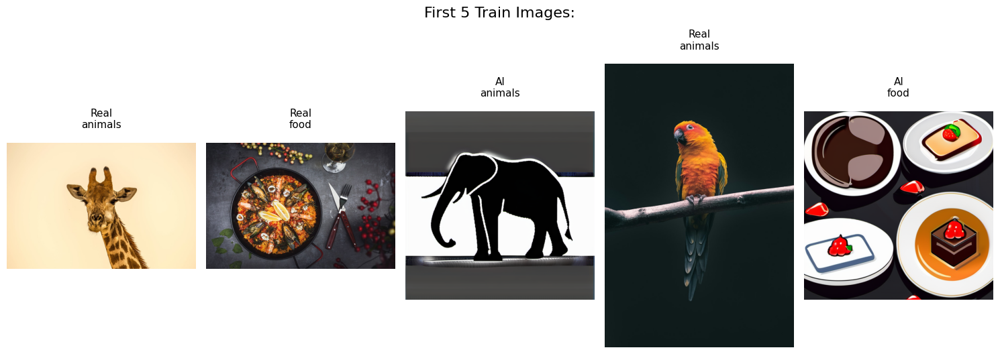

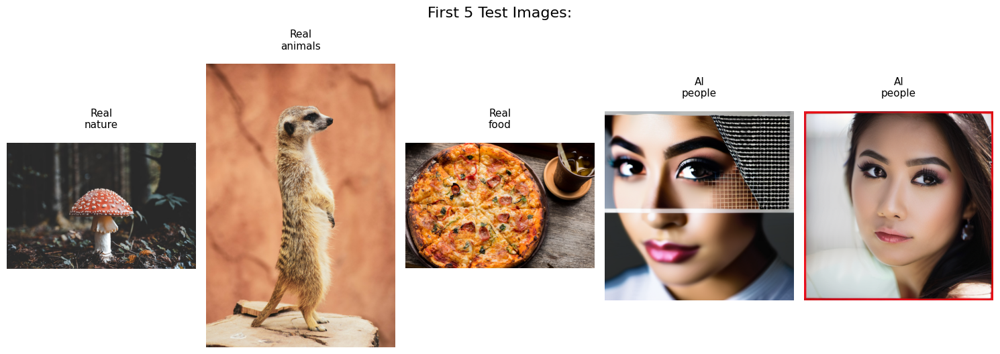

In [14]:
show_image_examples(train_df, "First 5 Train Images:")
print("\n")
show_image_examples(test_df, "First 5 Test Images:")

## Feature Engineering Methods

## 6. Feature Engineering 1: RGB Flatten

Machine learning algorithms cannot work directly with image files.
Therefore, each image must be converted into a numerical representation.

In this first feature engineering method, we perform the following steps:

1. Load the image from its file path.
2. Convert the image to RGB format.
3. Resize the image to a fixed size of 32x32 pixels.
4. Convert the image into a NumPy array.
5. Normalize pixel values from the range 0-255 to the range 0-1.
6. Flatten the 3D image array into a 1D feature vector.

Since each image is resized to 32x32 pixels with 3 color channels, each image is represented by:

32 × 32 × 3 = 3072 numerical features.

### 6.1 Extracting Flatten Features from a Single Image

The following function receives an image path and converts the image into a numerical feature vector.

This function will be used later for both the training set and the test set.

In [15]:
import numpy as np

In [16]:
def extract_flatten_features(image_path, image_size=(32, 32)):
    """
    Convert a single image into a numerical feature vector.

    Parameters:
    image_path: path to the image file
    image_size: target size for resizing the image

    Returns:
    A 1D NumPy array containing the image features
    """

    # Load the image from the given path and convert it to RGB format
    img = Image.open(image_path).convert("RGB")

    # Resize the image to a fixed size
    img = img.resize(image_size)

    # Convert the image into a NumPy array
    img_array = np.array(img)

    # Normalize pixel values from 0-255 to 0-1
    img_array = img_array / 255.0

    # Flatten the 3D array into a 1D vector
    features = img_array.flatten()

    return features

### 6.2 Testing the Feature Extraction Function on One Image

Before applying the feature extraction function to the entire dataset, we test it on one image from the training set.

This allows us to verify that the output vector has the expected size.

In [17]:
# Select one image from the training set
sample_path = train_df.iloc[0]["filepath"]

# Extract features from the selected image
sample_features = extract_flatten_features(sample_path)

print("Sample image path:", sample_path)
print("Feature vector shape:", sample_features.shape)
print("First 10 feature values:")
print(sample_features[:10])

Sample image path: /content/dataset/real_dataset/animals/animals_93.jpg
Feature vector shape: (3072,)
First 10 feature values:
[0.95294118 0.84313725 0.67843137 0.96078431 0.85882353 0.69803922
 0.96470588 0.8745098  0.71764706 0.97647059]


### 6.3 Building Feature Matrices for Train and Test Sets

After verifying the feature extraction function on a single image, we apply it to all images in the training and test sets.

The output will be:

- `X_train`: feature matrix for training images
- `y_train`: labels for training images
- `X_test`: feature matrix for test images
- `y_test`: labels for test images

In [18]:
def build_feature_matrix(dataframe, feature_function, image_size=(32, 32)):
    """
    Convert all images in a DataFrame into a feature matrix and label vector.

    Parameters:
    dataframe: DataFrame containing image paths and labels
    feature_function: function used to extract features from each image
    image_size: target size for resizing the images

    Returns:
    X: 2D NumPy array of image features
    y: 1D NumPy array of labels
    """

    X = []
    y = []

    # Loop over each image in the DataFrame
    for _, row in dataframe.iterrows():

        # Extract features from the image
        features = feature_function(row["filepath"], image_size=image_size)

        # Add the feature vector to X
        X.append(features)

        # Add the image label to y
        y.append(row["label"])

    # Convert lists into NumPy arrays
    X = np.array(X)
    y = np.array(y)

    return X, y

In [19]:
X_train, y_train = build_feature_matrix(
    train_df,
    extract_flatten_features,
    image_size=(32, 32)
)

X_test, y_test = build_feature_matrix(
    test_df,
    extract_flatten_features,
    image_size=(32, 32)
)

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (400, 3072)
y_train shape: (400,)
X_test shape: (100, 3072)
y_test shape: (100,)


### 6.4 Visualizing the Feature Engineering Process

To better understand the feature engineering process, we display examples from the dataset before and after resizing.

For each example, we show:
- the original image
- the resized image
- the original image size
- the resized array shape
- the final flattened vector shape

This helps demonstrate how an image is converted into numerical features.

In [20]:
def show_feature_engineering_example(dataframe, index=0, image_size=(32, 32)):
    """
    Display the feature engineering process for a single image.
    """

    # Select one row from the DataFrame
    row = dataframe.iloc[index]

    # Load the original image
    original_img = Image.open(row["filepath"]).convert("RGB")

    # Resize the image
    resized_img = original_img.resize(image_size)

    # Convert resized image to NumPy array and normalize it
    img_array = np.array(resized_img) / 255.0

    # Flatten the image array into a 1D vector
    flattened = img_array.flatten()

    # Print technical details
    print("\nLabel:", row["label"])
    print("Category:", row["category"])
    print("Original image size:", original_img.size)
    print("Resized image size:", resized_img.size)
    print("Array shape after resize:", img_array.shape)
    print("Flattened vector shape:", flattened.shape)
    print("First 10 values in feature vector:")
    print(flattened[:10])

    # Display original and resized images side by side
    plt.figure(figsize=(9, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image", pad=12)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(resized_img)
    plt.title("Resized 32x32", pad=12)
    plt.axis("off")

    plt.subplots_adjust(top=0.80, wspace=0.35)
    plt.show()


Label: Real
Category: animals
Original image size: (1080, 720)
Resized image size: (32, 32)
Array shape after resize: (32, 32, 3)
Flattened vector shape: (3072,)
First 10 values in feature vector:
[0.95294118 0.84313725 0.67843137 0.96078431 0.85882353 0.69803922
 0.96470588 0.8745098  0.71764706 0.97647059]


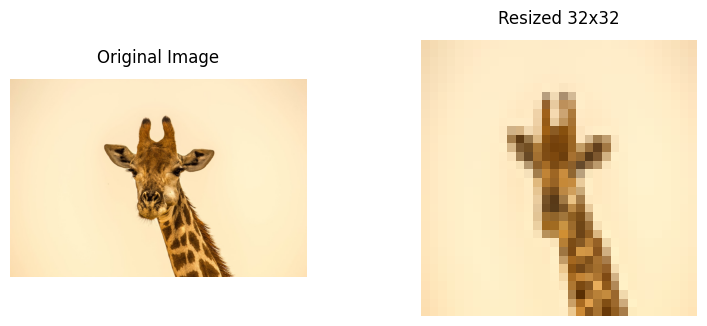


Label: Real
Category: food
Original image size: (1080, 720)
Resized image size: (32, 32)
Array shape after resize: (32, 32, 3)
Flattened vector shape: (3072,)
First 10 values in feature vector:
[0.12156863 0.12156863 0.14117647 0.12156863 0.1254902  0.14509804
 0.12156863 0.1254902  0.14509804 0.13333333]


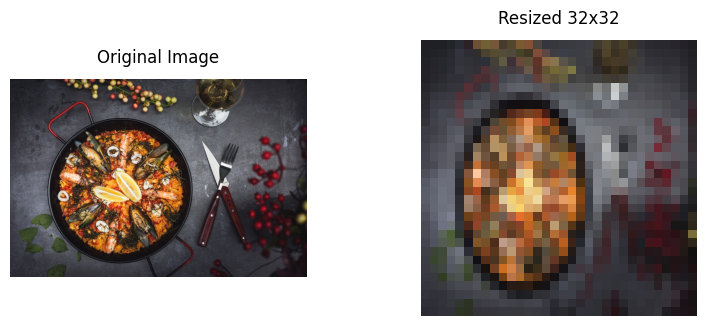


Label: Real
Category: nature
Original image size: (1080, 720)
Resized image size: (32, 32)
Array shape after resize: (32, 32, 3)
Flattened vector shape: (3072,)
First 10 values in feature vector:
[0.15686275 0.15686275 0.15686275 0.15686275 0.15686275 0.15686275
 0.16078431 0.16078431 0.16078431 0.16862745]


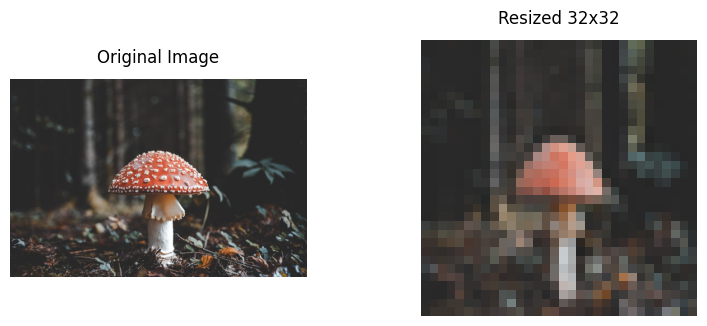


Label: Real
Category: animals
Original image size: (1080, 1620)
Resized image size: (32, 32)
Array shape after resize: (32, 32, 3)
Flattened vector shape: (3072,)
First 10 values in feature vector:
[0.56470588 0.32156863 0.21960784 0.49803922 0.27058824 0.18431373
 0.61568627 0.34509804 0.23921569 0.71372549]


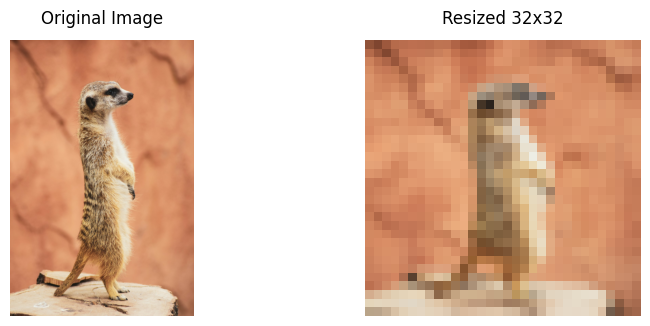

In [21]:
# Feature Engineering 1 examples
show_feature_engineering_example(train_df, index=0)
show_feature_engineering_example(train_df, index=1)
show_feature_engineering_example(test_df, index=0)
show_feature_engineering_example(test_df, index=1)

### 6.5 Summary of the First Feature Engineering Method

In this feature engineering method, each image was resized to 32x32 pixels, normalized, and flattened into a 1D vector.

This is a simple baseline representation of an image.  
It keeps the raw pixel information but does not explicitly extract higher-level visual patterns such as edges, shapes, or textures.

This representation will be used as the first input method for our KNN classifier.
Later, we can compare it with other feature extraction methods, such as grayscale flattening or color histograms.

## 7. Feature Engineering 2: Grayscale Flatten

In the first feature engineering method, we used RGB Flatten, where each image was represented using all three color channels.

In this method, we convert each image to grayscale before flattening it.

A grayscale image contains only one intensity channel instead of three RGB channels.

The process is:

1. Load the image from its file path.
2. Convert the image to grayscale.
3. Resize the image to 32x32 pixels.
4. Convert the image into a NumPy array.
5. Normalize pixel values from 0-255 to 0-1.
6. Flatten the 2D grayscale image into a 1D feature vector.

Since each image is resized to 32x32 pixels with one grayscale channel, each image is represented by:

32 × 32 = 1024 numerical features.

This method allows us to test whether brightness and structure information are useful for distinguishing between AI-generated and real images, without using color information.

### 7.1 Extracting Grayscale Flatten Features from a Single Image

The following function receives an image path and converts the image into a grayscale flattened feature vector.

Unlike RGB Flatten, this method does not keep the three color channels.  
Instead, it converts the image to grayscale and keeps only one intensity channel.

In [22]:
def extract_grayscale_flatten_features(image_path, image_size=(32, 32)):
    """
    Convert a single image into a grayscale flattened feature vector.

    Parameters:
    image_path: path to the image file
    image_size: target size for resizing the image

    Returns:
    A 1D NumPy array containing the grayscale flattened image features
    """

    # Step 1:
    # Load the image from the given path.
    # convert("L") converts the image to grayscale.
    # In PIL, "L" means one-channel grayscale image.
    img = Image.open(image_path).convert("L")

    # Step 2:
    # Resize the grayscale image to a fixed size.
    # This ensures that all images have the same dimensions.
    img = img.resize(image_size)

    # Step 3:
    # Convert the grayscale image into a NumPy array.
    # The array shape will be: height x width.
    img_array = np.array(img)

    # Step 4:
    # Normalize pixel values from the range 0-255 to the range 0-1.
    img_array = img_array / 255.0

    # Step 5:
    # Flatten the 2D grayscale image into a 1D vector.
    # For a 32x32 image, the final vector size is 1024.
    features = img_array.flatten()

    # Step 6:
    # Return the final feature vector.
    return features

### 7.2 Testing the Grayscale Flatten Feature Extraction

Before applying the grayscale flatten feature extraction to the entire dataset, we test it on one image from the training set.

This allows us to verify:

- the feature vector size
- the first values of the feature vector
- that the function returns a valid numerical representation

In [23]:
sample_path = train_df.iloc[0]["filepath"]

sample_gray_features = extract_grayscale_flatten_features(
    sample_path,
    image_size=(32, 32)
)

print("Sample image path:", sample_path)
print("Grayscale flatten feature vector shape:", sample_gray_features.shape)
print("First 10 feature values:")
print(sample_gray_features[:10])

Sample image path: /content/dataset/real_dataset/animals/animals_93.jpg
Grayscale flatten feature vector shape: (1024,)
First 10 feature values:
[0.85490196 0.87058824 0.88235294 0.89411765 0.90588235 0.91372549
 0.91764706 0.9254902  0.9254902  0.92941176]


### 7.3 Building Grayscale Flatten Feature Matrices

After testing the grayscale flatten feature extraction on a single image, we apply it to all images in the training and test sets.

The output will be:

- `X_train_gray_flat`: grayscale flatten feature matrix for training images
- `y_train_gray_flat`: labels for the training images
- `X_test_gray_flat`: grayscale flatten feature matrix for test images
- `y_test_gray_flat`: labels for the test images

The labels remain the same as before.  
Only the feature representation changes.

In [24]:
def build_feature_matrix(dataframe, feature_function, image_size=(32, 32)):
    """
    Convert all images in a DataFrame into a feature matrix and label vector.

    Parameters:
    dataframe: DataFrame containing image paths and labels
    feature_function: function used to extract features from each image
    image_size: target size for resizing the images

    Returns:
    X: 2D NumPy array of image features
    y: 1D NumPy array of labels
    """

    X = []
    y = []

    # Loop over each image in the DataFrame
    for _, row in dataframe.iterrows():

        # Extract features from the image
        features = feature_function(row["filepath"], image_size=image_size)

        # Add the feature vector to X
        X.append(features)

        # Add the image label to y
        y.append(row["label"])

    # Convert lists into NumPy arrays
    X = np.array(X)
    y = np.array(y)

    return X, y

In [25]:
X_train_gray_flat, y_train_gray_flat = build_feature_matrix(
    train_df,
    extract_grayscale_flatten_features,
    image_size=(32, 32)
)

X_test_gray_flat, y_test_gray_flat = build_feature_matrix(
    test_df,
    extract_grayscale_flatten_features,
    image_size=(32, 32)
)

print("X_train_gray_flat shape:", X_train_gray_flat.shape)
print("y_train_gray_flat shape:", y_train_gray_flat.shape)

print("X_test_gray_flat shape:", X_test_gray_flat.shape)
print("y_test_gray_flat shape:", y_test_gray_flat.shape)

X_train_gray_flat shape: (400, 1024)
y_train_gray_flat shape: (400,)
X_test_gray_flat shape: (100, 1024)
y_test_gray_flat shape: (100,)


### 7.4 Visualizing the Grayscale Flatten Process

To better understand this feature engineering method, we display examples before and after converting them to grayscale.

For each example, we show:

- the original RGB image
- the grayscale resized image
- the original image size
- the grayscale image array shape
- the final flattened vector shape

In [26]:
def show_grayscale_flatten_example(dataframe, index=0, image_size=(32, 32)):
    """
    Display the grayscale flatten feature engineering process for a single image.
    """

    # Select one row from the DataFrame
    row = dataframe.iloc[index]

    # Load the original RGB image
    original_img = Image.open(row["filepath"]).convert("RGB")

    # Convert the image to grayscale
    grayscale_img = original_img.convert("L")

    # Resize the grayscale image
    resized_gray_img = grayscale_img.resize(image_size)

    # Convert resized grayscale image to NumPy array and normalize it
    gray_array = np.array(resized_gray_img) / 255.0

    # Flatten the 2D grayscale array into a 1D vector
    flattened = gray_array.flatten()

    # Print technical details
    print("\nLabel:", row["label"])
    print("Category:", row["category"])
    print("Original image size:", original_img.size)
    print("Grayscale resized image size:", resized_gray_img.size)
    print("Array shape after grayscale resize:", gray_array.shape)
    print("Flattened vector shape:", flattened.shape)
    print("First 10 values in feature vector:")
    print(flattened[:10])

    # Display original and grayscale images side by side
    plt.figure(figsize=(9, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original RGB Image", pad=12)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(resized_gray_img, cmap="gray")
    plt.title("Grayscale 32x32", pad=12)
    plt.axis("off")

    plt.subplots_adjust(top=0.80, wspace=0.35)
    plt.show()


Label: Real
Category: animals
Original image size: (1080, 720)
Grayscale resized image size: (32, 32)
Array shape after grayscale resize: (32, 32)
Flattened vector shape: (1024,)
First 10 values in feature vector:
[0.85490196 0.87058824 0.88235294 0.89411765 0.90588235 0.91372549
 0.91764706 0.9254902  0.9254902  0.92941176]


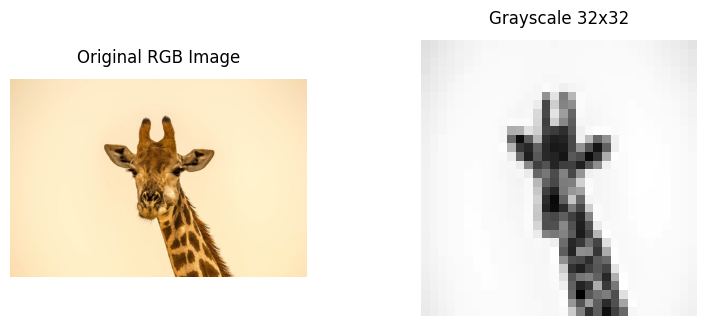


Label: Real
Category: food
Original image size: (1080, 720)
Grayscale resized image size: (32, 32)
Array shape after grayscale resize: (32, 32)
Flattened vector shape: (1024,)
First 10 values in feature vector:
[0.12156863 0.1254902  0.1254902  0.14117647 0.17254902 0.14901961
 0.3372549  0.37647059 0.36470588 0.23921569]


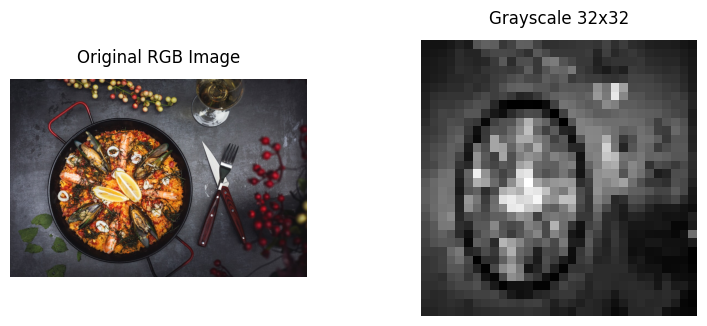


Label: Real
Category: nature
Original image size: (1080, 720)
Grayscale resized image size: (32, 32)
Array shape after grayscale resize: (32, 32)
Flattened vector shape: (1024,)
First 10 values in feature vector:
[0.15686275 0.15686275 0.16078431 0.16470588 0.16078431 0.16078431
 0.15686275 0.16862745 0.28627451 0.19215686]


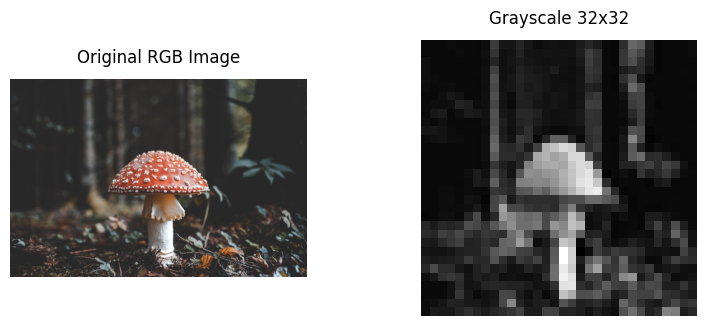


Label: Real
Category: animals
Original image size: (1080, 1620)
Grayscale resized image size: (32, 32)
Array shape after grayscale resize: (32, 32)
Flattened vector shape: (1024,)
First 10 values in feature vector:
[0.38431373 0.32941176 0.41568627 0.49411765 0.50196078 0.51372549
 0.50980392 0.50196078 0.5254902  0.5254902 ]


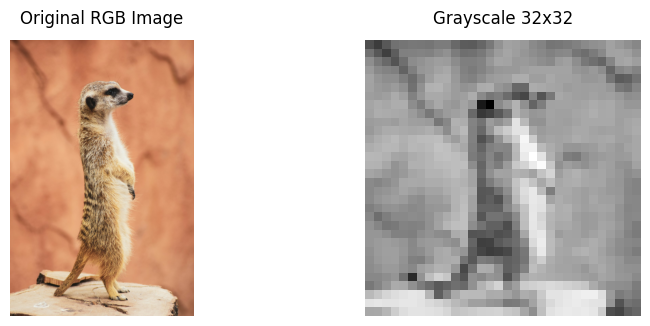

In [27]:
show_grayscale_flatten_example(train_df, index=0)
show_grayscale_flatten_example(train_df, index=1)
show_grayscale_flatten_example(test_df, index=0)
show_grayscale_flatten_example(test_df, index=1)

### 7.5 Summary of the Grayscale Flatten Feature Engineering Method

In this feature engineering method, each image was converted to grayscale, resized to 32x32 pixels, normalized, and flattened into a 1D vector.

Unlike RGB Flatten, this method does not use color information.  
It keeps only one grayscale intensity channel.

Since each image has a size of 32x32 pixels, each image is represented by:

32 × 32 = 1024 numerical features.

This representation is simpler and smaller than RGB Flatten, which uses 3072 features.

The goal of this method is to test whether brightness, contrast, and general structure are useful for distinguishing between AI-generated and real images.

This feature representation will later be compared with RGB Flatten, Color Histogram, and Grayscale Histogram using the KNN classifier.

## 8. Feature Engineering 3: Color Histogram

In the previous feature engineering method, each image was resized, normalized, and flattened into a raw pixel vector.

Although this method is simple, it depends heavily on the exact position of pixels in the image.  
For complex images, this representation may not capture useful visual patterns.

In this section, we use a different feature representation: Color Histogram.

A color histogram describes the distribution of pixel intensity values in each color channel:
- Red
- Green
- Blue

Instead of representing each pixel separately, we count how many pixels fall into different intensity ranges.

This produces a shorter and more general feature vector that describes the color distribution of the image.

### 8.1 Extracting Color Histogram Features from a Single Image

The following function converts an image into a color histogram feature vector.

The image is first resized to a fixed size.  
Then, we calculate a histogram for each RGB color channel.

If we use 16 bins for each channel, the final feature vector contains:

16 bins × 3 color channels = 48 features.

In [28]:
def extract_color_histogram_features(image_path, image_size=(64, 64), bins=16):
    """
    Convert a single image into a color histogram feature vector.

    Parameters:
    image_path: path to the image file
    image_size: target size for resizing the image
    bins: number of histogram bins for each color channel

    Returns:
    A 1D NumPy array containing the color histogram features
    """

    # Load the image and convert it to RGB format
    img = Image.open(image_path).convert("RGB")

    # Resize the image to a fixed size
    img = img.resize(image_size)

    # Convert image to a NumPy array
    img_array = np.array(img)

    hist_features = []

    # Calculate histogram for each color channel: Red, Green, Blue
    for channel in range(3):
        channel_values = img_array[:, :, channel]

        hist, _ = np.histogram(
            channel_values,
            bins=bins,
            range=(0, 256)
        )

        hist_features.extend(hist)

    # Convert to NumPy array
    hist_features = np.array(hist_features, dtype=float)

    # Normalize the histogram so that images with different sizes are comparable
    hist_features = hist_features / np.sum(hist_features)

    return hist_features

### 8.2 Testing the Color Histogram Feature Extraction

Before applying the color histogram feature extraction to the entire dataset, we test it on one image.

This allows us to verify:
- the feature vector size
- the first values of the histogram
- that the function returns a valid numerical representation

In [29]:
sample_path = train_df.iloc[0]["filepath"]

sample_hist_features = extract_color_histogram_features(
    sample_path,
    image_size=(64, 64),
    bins=16
)

print("Sample image path:", sample_path)
print("Color histogram feature vector shape:", sample_hist_features.shape)
print("First 10 feature values:")
print(sample_hist_features[:10])
print("Sum of histogram values:", np.sum(sample_hist_features))

Sample image path: /content/dataset/real_dataset/animals/animals_93.jpg
Color histogram feature vector shape: (48,)
First 10 feature values:
[0.         0.00024414 0.00016276 0.00056966 0.0008138  0.00130208
 0.00431315 0.00602214 0.00675456 0.00716146]
Sum of histogram values: 1.0


### 8.3 Building Color Histogram Feature Matrices

After testing the color histogram feature extraction on a single image, we apply it to all images in the training and test sets.

The output will be:

- `X_train_hist`: color histogram feature matrix for training images
- `X_test_hist`: color histogram feature matrix for test images
- `y_train`: training labels
- `y_test`: test labels

The labels remain the same as before.
Only the feature representation changes.

In [30]:
def build_color_histogram_matrix(dataframe, image_size=(64, 64), bins=16):
    """
    Convert all images in a DataFrame into a color histogram feature matrix.

    Parameters:
    dataframe: DataFrame containing image paths and labels
    image_size: target size for resizing the images
    bins: number of histogram bins for each RGB channel

    Returns:
    X: 2D NumPy array of color histogram features
    y: 1D NumPy array of labels
    """

    X = []
    y = []

    # Loop over each image in the DataFrame
    for _, row in dataframe.iterrows():

        # Extract color histogram features from the image
        features = extract_color_histogram_features(
            row["filepath"],
            image_size=image_size,
            bins=bins
        )

        # Store features and label
        X.append(features)
        y.append(row["label"])

    # Convert lists to NumPy arrays
    X = np.array(X)
    y = np.array(y)

    return X, y

In [31]:
X_train_hist, y_train_hist = build_color_histogram_matrix(
    train_df,
    image_size=(64, 64),
    bins=16
)

X_test_hist, y_test_hist = build_color_histogram_matrix(
    test_df,
    image_size=(64, 64),
    bins=16
)

print("X_train_hist shape:", X_train_hist.shape)
print("y_train_hist shape:", y_train_hist.shape)

print("X_test_hist shape:", X_test_hist.shape)
print("y_test_hist shape:", y_test_hist.shape)

X_train_hist shape: (400, 48)
y_train_hist shape: (400,)
X_test_hist shape: (100, 48)
y_test_hist shape: (100,)


### 8.4 Visualizing the Color Histogram

To better understand the color histogram representation, we display one image together with its RGB histograms.

The histogram shows how pixel intensity values are distributed across the Red, Green, and Blue channels.

In [105]:
def show_color_histogram_example(dataframe, index=0, image_size=(64, 64), bins=16):
    """
    Display the original image, the resized image, and its RGB color histograms.

    This function helps visualize the Color Histogram feature engineering process.
    """

    # Select one row from the DataFrame
    row = dataframe.iloc[index]

    # Load the original image and make sure it is in RGB format
    original_img = Image.open(row["filepath"]).convert("RGB")

    # Resize the image to the size used for Color Histogram feature extraction
    resized_img = original_img.resize(image_size)

    # Convert the resized image into a NumPy array
    # Shape will be: height x width x 3 RGB channels
    img_array = np.array(resized_img)

    # Print technical information about the image and feature vector
    print("\nLabel:", row["label"])
    print("Category:", row["category"])
    print("Original image size:", original_img.size)
    print("Image size after resize:", resized_img.size)
    print("Number of bins per channel:", bins)
    print("Final feature vector size:", bins * 3)


    # Display original image and resized image side by side
    # -------------------------------------------------------

    plt.figure(figsize=(10, 4))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original RGB Image", pad=12)
    plt.axis("off")

    # Resized image
    plt.subplot(1, 2, 2)
    plt.imshow(resized_img)
    plt.title(f"Resized Image {image_size[0]}x{image_size[1]}", pad=12)
    plt.axis("off")

    plt.suptitle(
        f'Color Histogram Example\nLabel: {row["label"]} | Category: {row["category"]}',
        fontsize=14,
        y=1.05
    )

    plt.tight_layout()
    plt.show()


    # Display RGB histograms
    # ------------------------------

    # Channel names and matching plot colors
    channel_names = ["Red", "Green", "Blue"]
    channel_colors = ["red", "green", "blue"]

    plt.figure(figsize=(10, 4))

    # Loop over the three RGB channels
    for channel in range(3):

        # Extract one color channel from the image array
        channel_values = img_array[:, :, channel]

        # Calculate histogram for the current channel
        hist, bin_edges = np.histogram(
            channel_values,
            bins=bins,
            range=(0, 256)
        )

        # Plot the histogram using the matching RGB color
        plt.plot(
            bin_edges[:-1],
            hist,
            label=channel_names[channel],
            color=channel_colors[channel]
        )

    plt.title("RGB Color Histogram", pad=12)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Pixel Count")
    plt.legend()
    plt.tight_layout()
    plt.show()


Label: Real
Category: animals
Original image size: (1080, 720)
Image size after resize: (64, 64)
Number of bins per channel: 16
Final feature vector size: 48


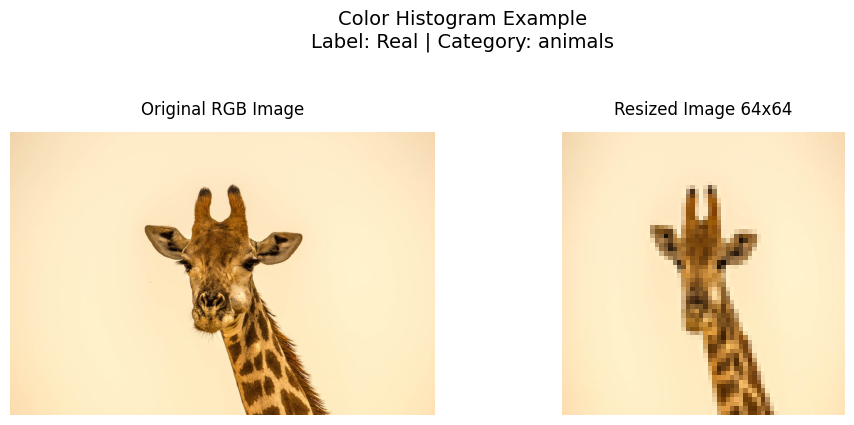

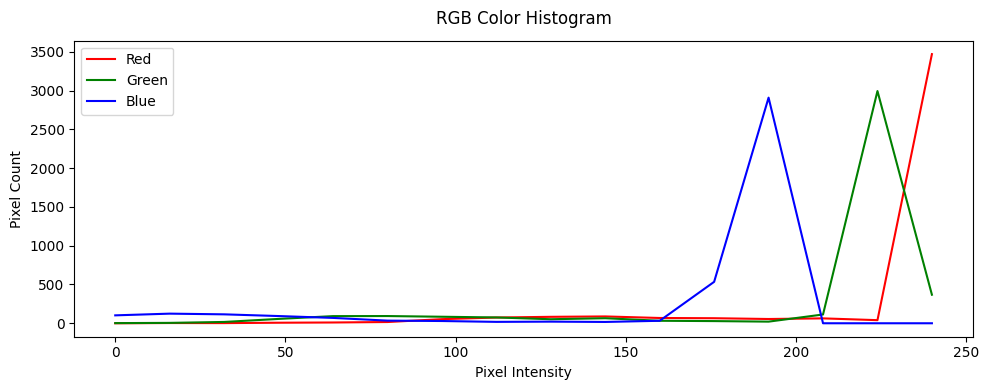


Label: Real
Category: food
Original image size: (1080, 720)
Image size after resize: (64, 64)
Number of bins per channel: 16
Final feature vector size: 48


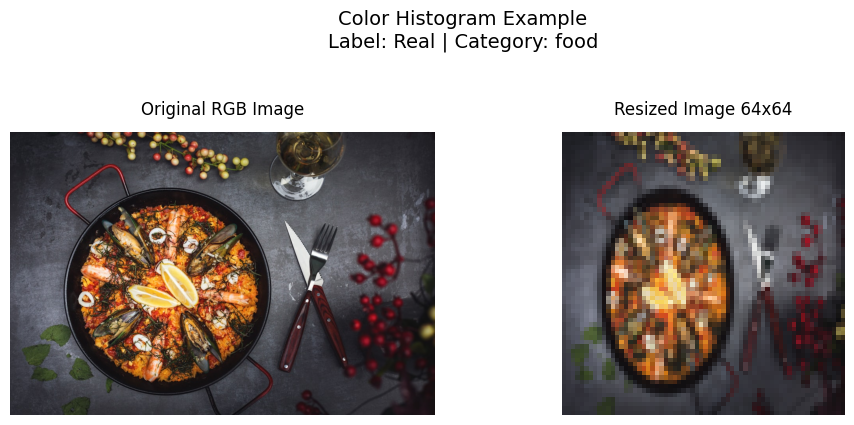

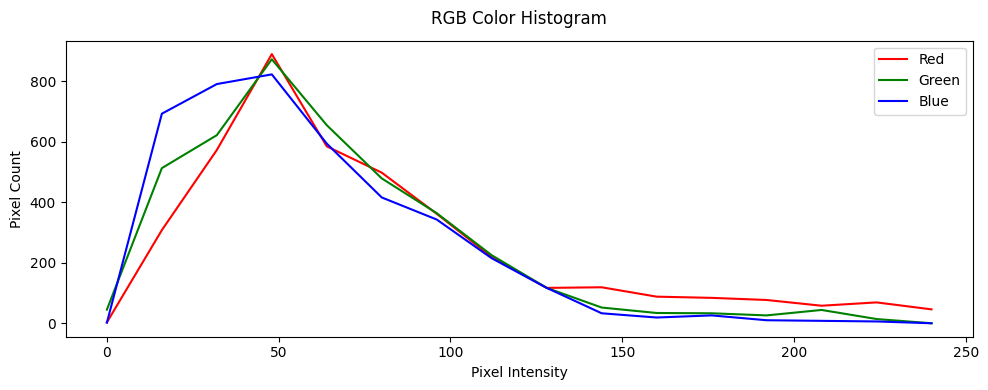


Label: Real
Category: nature
Original image size: (1080, 720)
Image size after resize: (64, 64)
Number of bins per channel: 16
Final feature vector size: 48


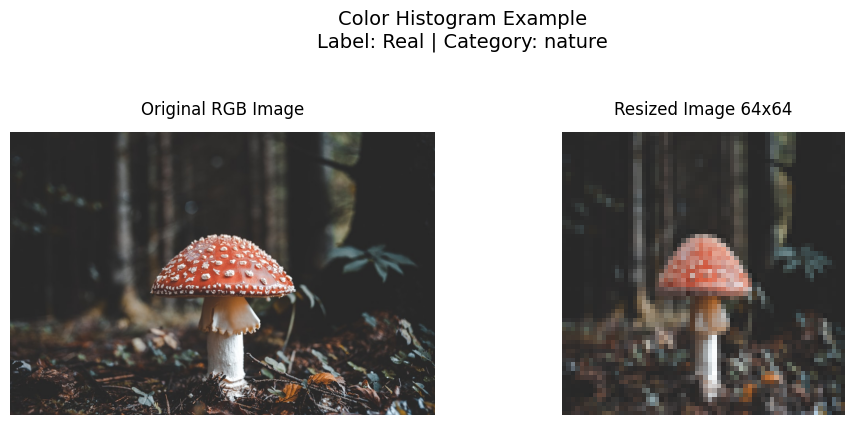

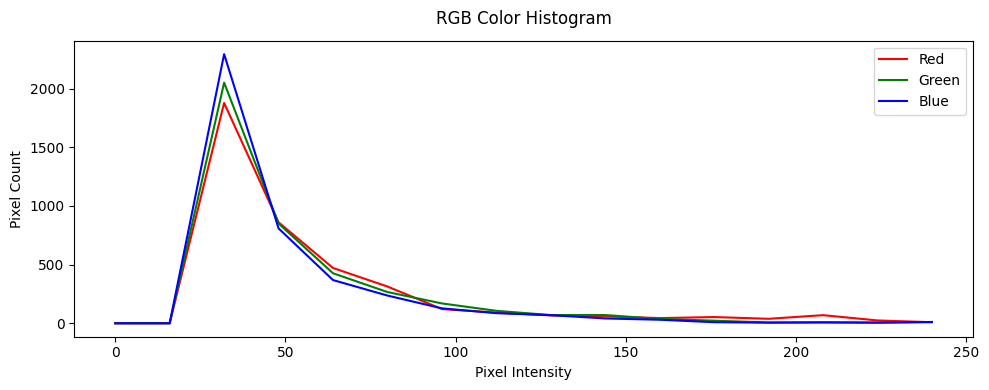


Label: Real
Category: animals
Original image size: (1080, 1620)
Image size after resize: (64, 64)
Number of bins per channel: 16
Final feature vector size: 48


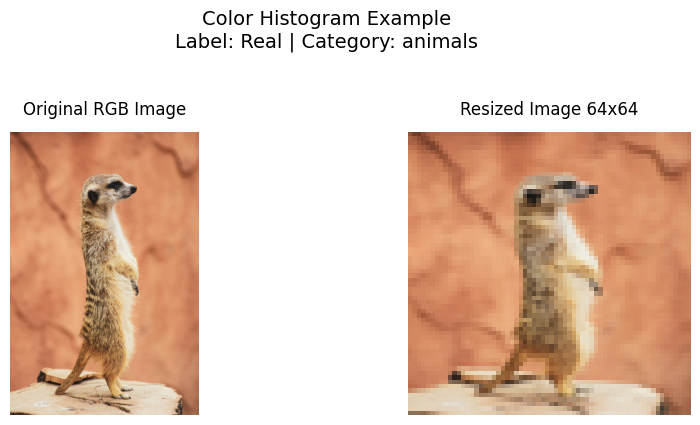

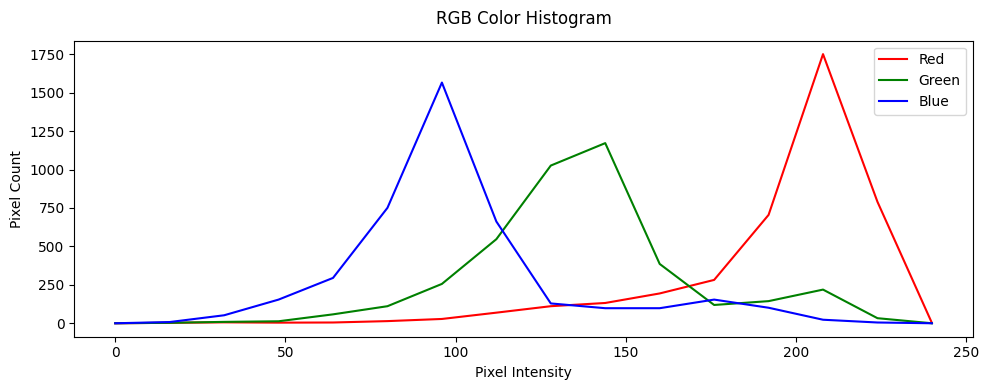

In [106]:
# Feature Engineering 2 examples
show_color_histogram_example(train_df, index=0)
show_color_histogram_example(train_df, index=1)
show_color_histogram_example(test_df, index=0)
show_color_histogram_example(test_df, index=1)

### 8.5 Summary of the Color Histogram Feature Engineering Method

In this feature engineering method, each image was resized to 64x64 pixels and converted into a color histogram representation.

Instead of using the raw pixel values directly, this method describes the distribution of pixel intensities in the three RGB color channels: Red, Green, and Blue.

For each color channel, we calculated a histogram using a fixed number of bins.  
For example, when using 16 bins per channel, each image is represented by:

16 × 3 = 48 numerical features.

The histogram values were normalized so that the feature vector represents the relative distribution of colors rather than the absolute number of pixels.

Compared to RGB Flatten, this representation is shorter and less dependent on the exact position of pixels in the image.

This feature engineering method will be used as an additional input representation for our KNN classifier.

## 9. Feature Engineering 4: Grayscale Histogram

In this feature engineering method, we represent each image using a histogram of grayscale pixel intensities.

Instead of using RGB color channels, we convert the image to grayscale and calculate a histogram over the pixel brightness values.

The process is:

1. Load the image from its file path.
2. Convert the image to grayscale.
3. Resize the image to a fixed size.
4. Convert the image into a NumPy array.
5. Calculate a histogram over grayscale intensity values.
6. Normalize the histogram.

The grayscale intensity values range from 0 to 255:

- 0 represents black
- 255 represents white

If we use 32 bins, each image is represented by 32 numerical features.

This method allows us to test whether the distribution of brightness values is useful for classifying AI-generated and real images.

### 9.1 Extracting Grayscale Histogram Features from a Single Image

The following function converts an image into a grayscale histogram feature vector.

The image is first converted to grayscale.  
Then, a histogram is calculated over the grayscale intensity values.

If we use 32 bins, the final feature vector contains 32 features.

In [34]:
def extract_grayscale_histogram_features(image_path, image_size=(64, 64), bins=32):
    """
    Convert a single image into a grayscale histogram feature vector.

    Parameters:
    image_path: path to the image file
    image_size: target size for resizing the image
    bins: number of histogram bins

    Returns:
    A 1D NumPy array containing the grayscale histogram features
    """

    # Step 1:
    # Load the image and convert it to grayscale.
    # "L" mode creates a single-channel grayscale image.
    img = Image.open(image_path).convert("L")

    # Step 2:
    # Resize the image to a fixed size.
    # This keeps preprocessing consistent across all images.
    img = img.resize(image_size)

    # Step 3:
    # Convert the grayscale image into a NumPy array.
    # The shape will be: height x width.
    img_array = np.array(img)

    # Step 4:
    # Calculate a histogram over grayscale intensity values.
    # Pixel values range from 0 to 255.
    hist, _ = np.histogram(
        img_array,
        bins=bins,
        range=(0, 256)
    )

    # Step 5:
    # Convert histogram counts to float values.
    hist_features = np.array(hist, dtype=float)

    # Step 6:
    # Normalize the histogram so that the sum of all values is 1.
    # This makes the representation focus on relative brightness distribution.
    hist_features = hist_features / np.sum(hist_features)

    # Step 7:
    # Return the final feature vector.
    return hist_features

### 9.2 Testing the Grayscale Histogram Feature Extraction

Before applying the grayscale histogram feature extraction to the entire dataset, we test it on one image.

This allows us to verify:

- the feature vector size
- the first values of the histogram
- that the histogram is normalized correctly

In [35]:
sample_path = train_df.iloc[0]["filepath"]

sample_gray_hist_features = extract_grayscale_histogram_features(
    sample_path,
    image_size=(64, 64),
    bins=32
)

print("Sample image path:", sample_path)
print("Grayscale histogram feature vector shape:", sample_gray_hist_features.shape)
print("First 10 feature values:")
print(sample_gray_hist_features[:10])
print("Sum of histogram values:", np.sum(sample_gray_hist_features))

Sample image path: /content/dataset/real_dataset/animals/animals_93.jpg
Grayscale histogram feature vector shape: (32,)
First 10 feature values:
[0.         0.00024414 0.00073242 0.00024414 0.0012207  0.00146484
 0.00244141 0.00415039 0.00854492 0.01196289]
Sum of histogram values: 1.0


### 9.3 Building Grayscale Histogram Feature Matrices

After testing the grayscale histogram feature extraction on a single image, we apply it to all images in the training and test sets.

The output will be:

- `X_train_gray_hist`: grayscale histogram feature matrix for training images
- `y_train_gray_hist`: labels for the training images
- `X_test_gray_hist`: grayscale histogram feature matrix for test images
- `y_test_gray_hist`: labels for the test images

The labels remain the same as before.  
Only the feature representation changes.

In [36]:
def build_grayscale_histogram_matrix(dataframe, image_size=(64, 64), bins=32):
    """
    Convert all images in a DataFrame into a grayscale histogram feature matrix.

    Parameters:
    dataframe: DataFrame containing image paths and labels
    image_size: target size for resizing the images
    bins: number of histogram bins

    Returns:
    X: 2D NumPy array of grayscale histogram features
    y: 1D NumPy array of labels
    """

    X = []
    y = []

    # Loop over each image in the DataFrame
    for _, row in dataframe.iterrows():

        # Extract grayscale histogram features from the image
        features = extract_grayscale_histogram_features(
            row["filepath"],
            image_size=image_size,
            bins=bins
        )

        # Store features and label
        X.append(features)
        y.append(row["label"])

    # Convert lists into NumPy arrays
    X = np.array(X)
    y = np.array(y)

    return X, y

In [37]:
X_train_gray_hist, y_train_gray_hist = build_grayscale_histogram_matrix(
    train_df,
    image_size=(64, 64),
    bins=32
)

X_test_gray_hist, y_test_gray_hist = build_grayscale_histogram_matrix(
    test_df,
    image_size=(64, 64),
    bins=32
)

print("X_train_gray_hist shape:", X_train_gray_hist.shape)
print("y_train_gray_hist shape:", y_train_gray_hist.shape)

print("X_test_gray_hist shape:", X_test_gray_hist.shape)
print("y_test_gray_hist shape:", y_test_gray_hist.shape)

X_train_gray_hist shape: (400, 32)
y_train_gray_hist shape: (400,)
X_test_gray_hist shape: (100, 32)
y_test_gray_hist shape: (100,)


### 9.4 Visualizing the Grayscale Histogram

To better understand the grayscale histogram representation, we display one image together with its grayscale intensity histogram.

The histogram shows how pixel brightness values are distributed across the image.

In [107]:
def show_grayscale_histogram_example(dataframe, index=0, image_size=(64, 64), bins=32):
    """
    Display the original image, grayscale image, resized grayscale image,
    and the grayscale intensity histogram.

    This function helps visualize the Grayscale Histogram feature engineering process.
    """

    # Select one row from the DataFrame
    row = dataframe.iloc[index]

    # Load the original image and make sure it is in RGB format
    original_img = Image.open(row["filepath"]).convert("RGB")

    # Convert the original image to grayscale
    grayscale_img = original_img.convert("L")

    # Resize the grayscale image to the size used for histogram feature extraction
    resized_gray_img = grayscale_img.resize(image_size)

    # Convert the resized grayscale image into a NumPy array
    # Shape will be: height x width
    gray_array = np.array(resized_gray_img)

    # Calculate grayscale histogram
    # Pixel values range from 0 to 255
    hist, bin_edges = np.histogram(
        gray_array,
        bins=bins,
        range=(0, 256)
    )

    # Print technical information about the image and feature vector
    print("\nLabel:", row["label"])
    print("Category:", row["category"])
    print("Original image size:", original_img.size)
    print("Grayscale image size:", grayscale_img.size)
    print("Grayscale image size after resize:", resized_gray_img.size)
    print("Number of bins:", bins)
    print("Final feature vector size:", bins)


    # Display original, grayscale, and resized grayscale images
    # ------------------------------------------------------------

    plt.figure(figsize=(14, 4))

    # Original RGB image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original RGB Image", pad=12)
    plt.axis("off")

    # Grayscale image before resize
    plt.subplot(1, 3, 2)
    plt.imshow(grayscale_img, cmap="gray")
    plt.title("Grayscale Image", pad=12)
    plt.axis("off")

    # Grayscale image after resize
    plt.subplot(1, 3, 3)
    plt.imshow(resized_gray_img, cmap="gray")
    plt.title(f"Resized Grayscale {image_size[0]}x{image_size[1]}", pad=12)
    plt.axis("off")

    plt.suptitle(
        f'Grayscale Histogram Example\nLabel: {row["label"]} | Category: {row["category"]}',
        fontsize=14,
        y=1.05
    )

    plt.tight_layout()
    plt.show()


    # Display grayscale histogram
    # ------------------------------

    plt.figure(figsize=(9, 4))

    # Plot the grayscale histogram using a dark gray line
    plt.plot(
        bin_edges[:-1],
        hist,
        color="dimgray",
        label="Grayscale intensity"
    )

    plt.title("Grayscale Intensity Histogram", pad=12)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Pixel Count")
    plt.legend()
    plt.tight_layout()
    plt.show()


Label: Real
Category: animals
Original image size: (1080, 720)
Grayscale image size: (1080, 720)
Grayscale image size after resize: (64, 64)
Number of bins: 32
Final feature vector size: 32


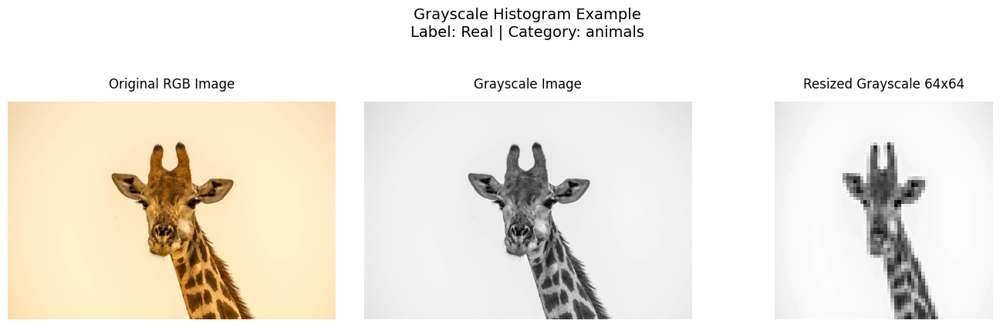

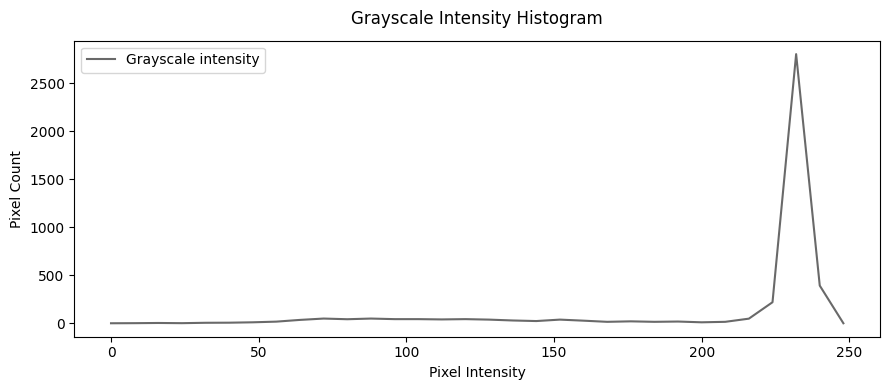


Label: Real
Category: food
Original image size: (1080, 720)
Grayscale image size: (1080, 720)
Grayscale image size after resize: (64, 64)
Number of bins: 32
Final feature vector size: 32


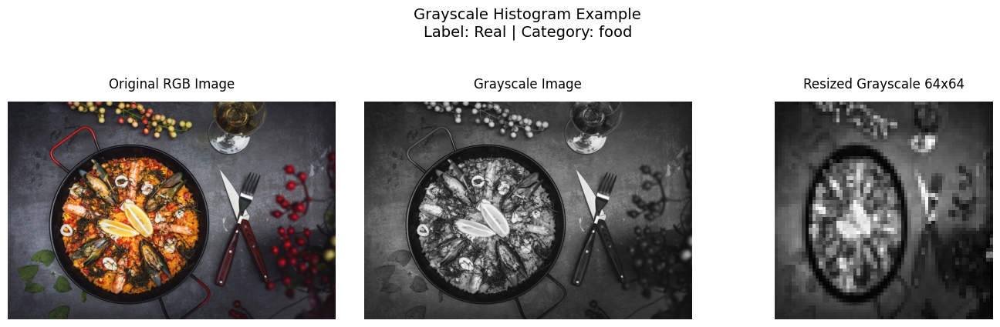

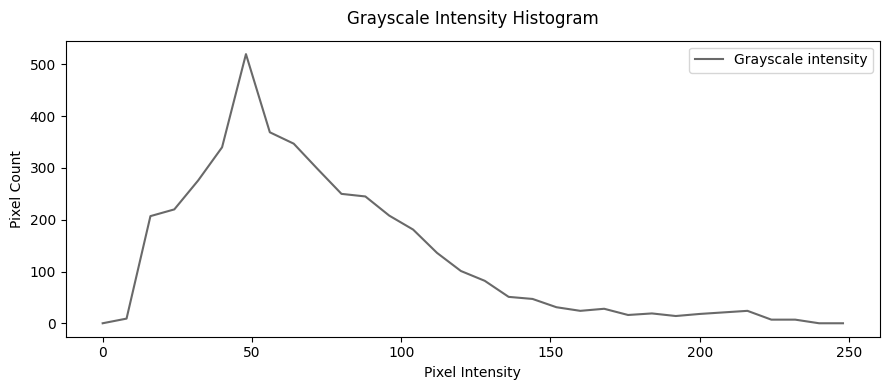


Label: Real
Category: nature
Original image size: (1080, 720)
Grayscale image size: (1080, 720)
Grayscale image size after resize: (64, 64)
Number of bins: 32
Final feature vector size: 32


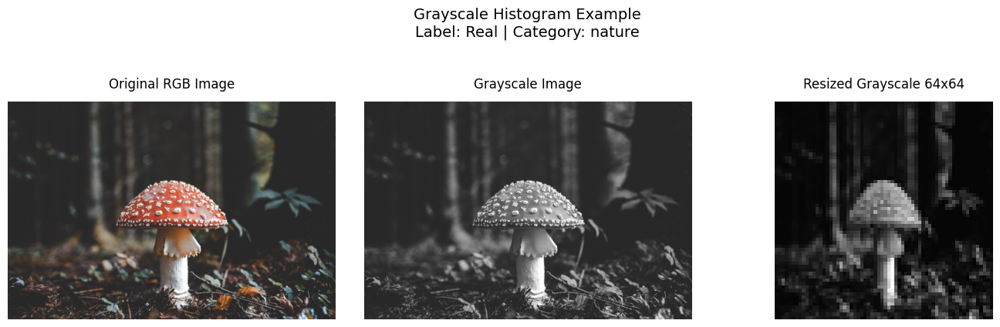

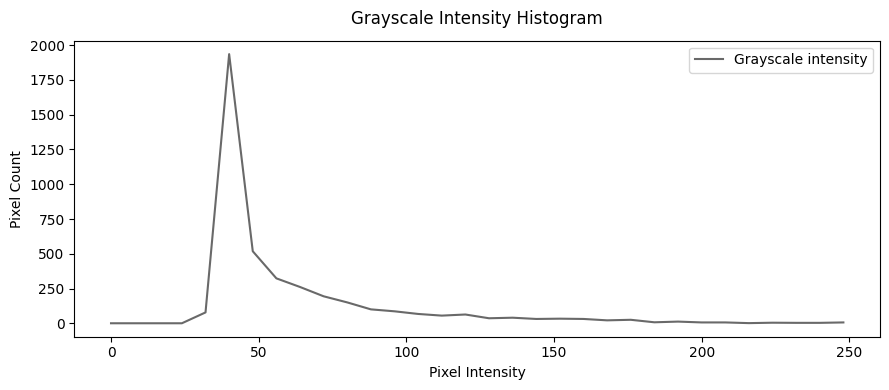


Label: Real
Category: animals
Original image size: (1080, 1620)
Grayscale image size: (1080, 1620)
Grayscale image size after resize: (64, 64)
Number of bins: 32
Final feature vector size: 32


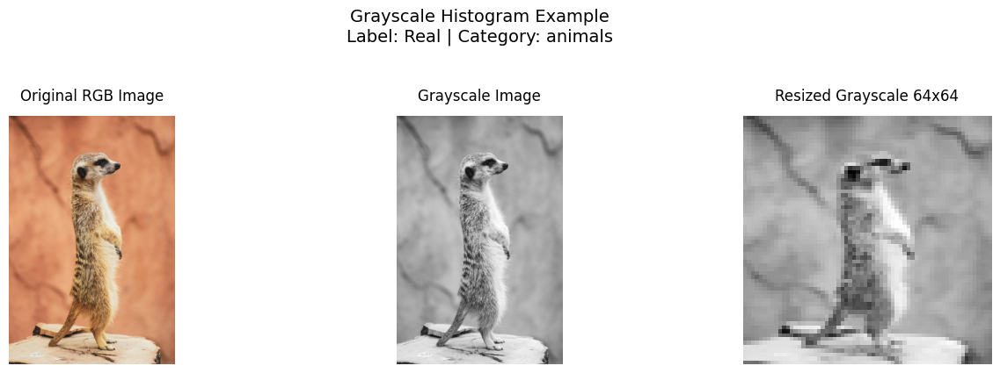

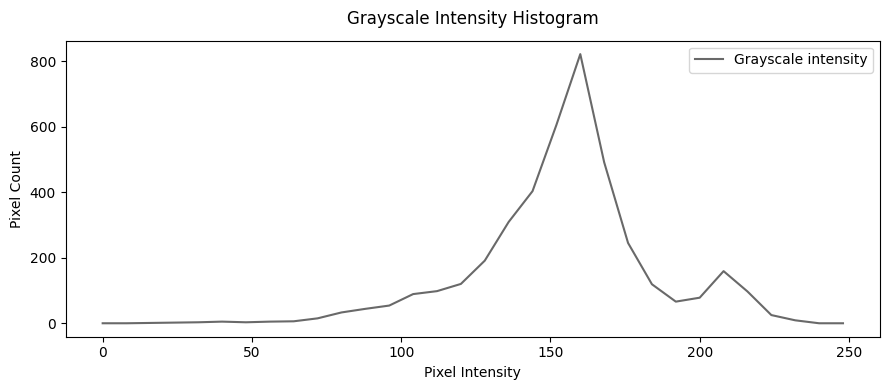

In [108]:
show_grayscale_histogram_example(train_df, index=0)
show_grayscale_histogram_example(train_df, index=1)
show_grayscale_histogram_example(test_df, index=0)
show_grayscale_histogram_example(test_df, index=1)

### 9.5 Summary of the Grayscale Histogram Feature Engineering Method

In this feature engineering method, each image was converted to grayscale and represented using a histogram of brightness values.

Instead of using raw pixel positions, this method describes the distribution of grayscale intensity values in the image.

If we use 32 bins, each image is represented by 32 numerical features.

This representation is much shorter than both RGB Flatten and Grayscale Flatten.

Unlike Grayscale Flatten, this method does not preserve the exact location of pixels.  
Instead, it focuses on the overall distribution of dark, medium, and bright pixels.

The goal of this method is to test whether brightness distribution can help distinguish between AI-generated and real images.

This feature representation will later be compared with RGB Flatten, Grayscale Flatten, and Color Histogram using the KNN classifier.

## 10. KNN Classifier from Scratch

In this section, we implement the K-Nearest Neighbors algorithm from scratch.

KNN is a supervised classification algorithm.  
It predicts the class of a new sample based on the labels of the `k` closest samples in the training set.

For each test image, the algorithm performs the following steps:

1. Calculate the distance between the test image and every image in the training set.
2. Select the `k` nearest training samples.
3. Count the labels of these nearest neighbors.
4. Predict the label that appears most often.

In this implementation, we do not use a ready-made machine learning model from libraries such as scikit-learn.  
The classifier is implemented manually using NumPy.

In [40]:
from collections import Counter # Will helps count labels

### 10.1 Distance Functions

KNN depends on a distance function that measures how similar or different two samples are.

In this project, each image is represented as a numerical vector of 3072 features.

We implement two distance metrics:

1. Euclidean Distance [ exp.: sqrt((x1-y1)^2 + (x2-y2)^2 + ... + (xn-yn)^2) ]
2. Manhattan Distance [ exp.: |x1-y1| + |x2-y2| + ... + |xn-yn| ]

These distance metrics will later be used as hyperparameters in our experiments.

In [41]:
def euclidean_distance(x1, x2):
    """
    Calculate the Euclidean distance between two vectors.

    Parameters:
    x1: first feature vector
    x2: second feature vector

    Returns:
    Euclidean distance between x1 and x2
    """

    return np.sqrt(np.sum((x1 - x2) ** 2))

In [42]:
def manhattan_distance(x1, x2):
    """
    Calculate the Manhattan distance between two vectors.

    Parameters:
    x1: first feature vector
    x2: second feature vector

    Returns:
    Manhattan distance between x1 and x2
    """

    return np.sum(np.abs(x1 - x2))

### 10.2 Testing the Distance Functions

Before implementing the full KNN classifier, we test the distance functions on two training images.

This helps verify that the feature vectors can be compared numerically.

In [43]:
# Select two images from the training feature matrix
sample_1 = X_train[0]
sample_2 = X_train[1]

print("Sample 1 shape:", sample_1.shape)
print("Sample 2 shape:", sample_2.shape)

print("Euclidean distance:", euclidean_distance(sample_1, sample_2))
print("Manhattan distance:", manhattan_distance(sample_1, sample_2))

Sample 1 shape: (3072,)
Sample 2 shape: (3072,)
Euclidean distance: 32.74742342336106
Manhattan distance: 1683.5333333333333


### 10.3 Implementing the KNN Classifier

The following class implements the KNN algorithm from scratch.

The classifier includes:

- `__init__`: defines the hyperparameters, such as `k` and the distance metric.
- `fit`: stores the training data.
- `predict_one`: predicts the label of a single sample.
- `predict`: predicts labels for multiple samples.

Unlike many other algorithms, KNN does not build a mathematical model during training.
Instead, it stores the training data and uses it during prediction.

In [44]:
class KNNClassifier:
    """
    K-Nearest Neighbors classifier implemented from scratch.
    """

    def __init__(self, k=3, distance_metric="euclidean"):
        """
        Initialize the KNN classifier.

        Parameters:
        k: number of nearest neighbors to use for prediction
        distance_metric: distance function to use, either 'euclidean' or 'manhattan'
        """

        self.k = k
        self.distance_metric = distance_metric
        self.X_train = None
        self.y_train = None

    def fit(self, X_train, y_train):
        """
        Store the training data.

        Parameters:
        X_train: feature matrix of training samples
        y_train: labels of training samples
        """

        self.X_train = X_train
        self.y_train = y_train

    def _calculate_distance(self, x1, x2):
        """
        Calculate the distance between two feature vectors according to the selected metric.
        """

        if self.distance_metric == "euclidean":
            return euclidean_distance(x1, x2)

        elif self.distance_metric == "manhattan":
            return manhattan_distance(x1, x2)

        else:
            raise ValueError("Unsupported distance metric. Use 'euclidean' or 'manhattan'.")

    def predict_one(self, x):
        """
        Predict the label for a single sample.

        Parameters:
        x: feature vector of one test sample

        Returns:
        predicted label
        """

        distances = []

        # Calculate the distance between the test sample and every training sample
        for i in range(len(self.X_train)):
            distance = self._calculate_distance(x, self.X_train[i])
            distances.append((distance, self.y_train[i]))

        # Sort by distance from smallest to largest
        distances.sort(key=lambda item: item[0])

        # Select the labels of the k nearest neighbors
        k_nearest_labels = [label for _, label in distances[:self.k]]

        # Count the labels and choose the most common one
        most_common_label = Counter(k_nearest_labels).most_common(1)[0][0]

        return most_common_label

    def predict(self, X):
        """
        Predict labels for multiple samples.

        Parameters:
        X: feature matrix of samples to classify

        Returns:
        NumPy array of predicted labels
        """

        predictions = []

        # Predict each sample separately
        for x in X:
            predicted_label = self.predict_one(x)
            predictions.append(predicted_label)

        return np.array(predictions)

## 11. Model Evaluation Helper Functions

In this section, we define helper functions that will be used to evaluate all models in this project.

These functions are not specific to one experiment.  
They will be used for the baseline model, the hyperparameter experiments, and the final selected model.

The evaluation includes:

- Accuracy
- Precision
- Recall
- F1-score
- Macro F1-score
- Confusion Matrix
- Prediction visualization

Since this is a binary classification problem without a single central positive class, Macro F1 is used as the main evaluation metric.
Macro F1 gives equal importance to both classes: `AI` and `Real`.

### 11.1 Defining the Class Labels

The dataset contains two class labels:

- `AI`
- `Real`

We store them in a list so that all evaluation functions use the same label order.

In [45]:
labels = ["AI", "Real"]

### 11.2 Accuracy

Accuracy measures the percentage of correct predictions out of all predictions.

It is calculated as:

Accuracy = Correct Predictions / Total Predictions

However, accuracy can be misleading when the model predicts mostly one class.
Therefore, we also calculate precision, recall, F1-score, and Macro F1.

In [46]:
def calculate_accuracy(y_true, y_pred):
    """
    Calculate the accuracy of the model.

    Parameters:
    y_true: true labels
    y_pred: predicted labels

    Returns:
    Accuracy score
    """

    # Count how many predictions are correct
    correct_predictions = np.sum(y_true == y_pred)

    # Count the total number of predictions
    total_predictions = len(y_true)

    # Calculate accuracy
    accuracy = correct_predictions / total_predictions

    return accuracy

### 11.3 Precision, Recall, F1-score and Macro F1

Accuracy gives a general view of the model performance, but it does not show how well the model performs on each class.

For this reason, we calculate three additional metrics for each class:

- `True Positives` (TP)
- `False Positives` (FP)
- `False Negatives` (FN)
- `Precision` = TP / (TP + FP)
- `Recall` = TP / (TP + FN)
- `F1-score` = 2 × Precision × Recall / (Precision + Recall)

**Precision** measures how many of the samples predicted as a class were actually correct.

**Recall** measures how many of the actual samples from a class were correctly detected.

**F1-score** combines precision and recall into one score.

**Macro F1** is the average F1-score across all classes.

In [47]:
def calculate_classification_metrics(y_true, y_pred, labels):
    """
    Calculate classification metrics from scratch.

    Parameters:
    y_true: array of true labels
    y_pred: array of predicted labels
    labels: list of class labels

    Returns:
    accuracy: overall accuracy score
    macro_f1: average F1-score across all classes
    metrics_df: DataFrame with metrics for each class
    """

    results = []

    # Calculate overall accuracy
    total_correct = np.sum(y_true == y_pred)
    accuracy = total_correct / len(y_true)

    # Calculate metrics for each class separately
    for label in labels:

        # True Positive:
        # The model predicted this label and the true label is also this label
        tp = np.sum((y_true == label) & (y_pred == label))

        # False Positive:
        # The model predicted this label, but the true label is different
        fp = np.sum((y_true != label) & (y_pred == label))

        # False Negative:
        # The true label is this label, but the model predicted a different label
        fn = np.sum((y_true == label) & (y_pred != label))

        # Precision:
        # Out of all samples predicted as this class, how many were correct?
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0

        # Recall:
        # Out of all actual samples of this class, how many did the model find?
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0

        # F1-score:
        # Harmonic mean of precision and recall
        f1_score = (
            2 * precision * recall / (precision + recall)
            if (precision + recall) > 0
            else 0
        )

        results.append({
            "class": label,
            "TP": tp,
            "FP": fp,
            "FN": fn,
            "precision": precision,
            "recall": recall,
            "f1_score": f1_score
        })

    # Convert results into a DataFrame
    metrics_df = pd.DataFrame(results)

    # Macro F1 is the average F1-score across all classes
    macro_f1 = metrics_df["f1_score"].mean()

    return accuracy, macro_f1, metrics_df

### 11.4 Prediction Distribution

Before looking only at evaluation scores, it is useful to compare the distribution of predicted labels with the distribution of true labels.

This helps us identify whether the model is biased toward one class.

In [48]:
def show_prediction_distribution(y_true, y_pred):
    """
    Display the distribution of predicted labels and true labels.
    """

    print("Prediction distribution:")
    print(pd.Series(y_pred).value_counts())

    print("\nTrue label distribution:")
    print(pd.Series(y_true).value_counts())

### 11.5 Confusion Matrix

A confusion matrix helps us understand the types of mistakes made by the model.

Rows represent the true labels.  
Columns represent the predicted labels.

For example:

- Row `AI`, column `AI`: AI images correctly classified as AI.
- Row `AI`, column `Real`: AI images incorrectly classified as Real.
- Row `Real`, column `Real`: Real images correctly classified as Real.
- Row `Real`, column `AI`: Real images incorrectly classified as AI.

In [49]:
def confusion_matrix_from_scratch(y_true, y_pred, labels):
    """
    Build a confusion matrix from scratch.

    Parameters:
    y_true: array of true labels
    y_pred: array of predicted labels
    labels: list of class labels

    Returns:
    A DataFrame representing the confusion matrix
    """

    # Create an empty matrix
    matrix = np.zeros((len(labels), len(labels)), dtype=int)

    # Map each label to an index
    label_to_index = {label: index for index, label in enumerate(labels)}

    # Fill the matrix
    for true_label, predicted_label in zip(y_true, y_pred):
        true_index = label_to_index[true_label]
        predicted_index = label_to_index[predicted_label]

        matrix[true_index, predicted_index] += 1

    # Convert the matrix into a readable DataFrame
    confusion_df = pd.DataFrame(
        matrix,
        index=[f"True {label}" for label in labels],
        columns=[f"Predicted {label}" for label in labels]
    )

    return confusion_df

### 11.6 Confusion Matrix Visualization

To make the confusion matrix easier to understand, we visualize it using Matplotlib.

In [50]:
def plot_confusion_matrix(confusion_df, title="Confusion Matrix"):
    """
    Display a confusion matrix as a heatmap.
    """

    plt.figure(figsize=(6, 5))
    plt.imshow(confusion_df.values)

    plt.title(title, fontsize=14, pad=12)

    plt.xticks(
        ticks=np.arange(len(confusion_df.columns)),
        labels=confusion_df.columns,
        rotation=30,
        ha="right"
    )

    plt.yticks(
        ticks=np.arange(len(confusion_df.index)),
        labels=confusion_df.index
    )

    # Add numbers inside the matrix cells
    for i in range(confusion_df.shape[0]):
        for j in range(confusion_df.shape[1]):
            plt.text(
                j,
                i,
                confusion_df.values[i, j],
                ha="center",
                va="center",
                color="red",
                fontsize=18
            )

    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()

### 11.7 Visualizing Prediction Examples

This helper function displays test images together with their true labels and predicted labels.

It will be used to show the first five predictions of the baseline model and the final selected model.

In [51]:
def show_predictions(dataframe, y_true, y_pred, n=5, title="First 5 Test Predictions"):
    """
    Display the first n test images with their true and predicted labels.
    """

    plt.figure(figsize=(15, 5))

    for i in range(n):
        row = dataframe.iloc[i]
        img = Image.open(row["filepath"]).convert("RGB")

        is_correct = y_true[i] == y_pred[i]
        result_text = "Correct" if is_correct else "Wrong"

        plt.subplot(1, n, i + 1)
        plt.imshow(img)

        plt.title(
            f"True: {y_true[i]}\n"
            f"Pred: {y_pred[i]}\n"
            f"{result_text}",
            pad=12,
            fontsize=10
        )

        plt.axis("off")

    plt.suptitle(title, fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

## 12. Baseline Experiment: RGB Flatten + KNN

In this section, we run the first baseline experiment.

The baseline model uses:

- Feature method: RGB Flatten
- Image size: 32x32
- Classifier: KNN implemented from scratch
- k = 3
- Distance metric = Euclidean

The goal of this baseline is to evaluate the simplest image representation before testing more advanced feature engineering methods and hyperparameter combinations.

### 12.1 Training the Baseline KNN Model

KNN does not learn model weights during training.

Instead, the `fit` function stores the training feature matrix and the training labels.

During prediction, the model compares each test sample to the stored training samples.

In [52]:
# Create a baseline KNN classifier
baseline_knn = KNNClassifier(
    k=3,
    distance_metric="euclidean"
)

# Store the RGB Flatten training data inside the classifier
baseline_knn.fit(X_train, y_train)

print("Baseline KNN model was fitted successfully.")
print("Feature method: RGB Flatten")
print("k:", baseline_knn.k)
print("Distance metric:", baseline_knn.distance_metric)

Baseline KNN model was fitted successfully.
Feature method: RGB Flatten
k: 3
Distance metric: euclidean


### 12.2 Testing the Baseline Model on a Single Test Image

Before predicting the entire test set, we test the classifier on one image.

This allows us to verify that:

- the model stores the training data correctly
- the distance calculation works
- the majority vote returns a valid label

Test image index: 0
Category: nature
True label: Real
Predicted label: Real
Result: Correct


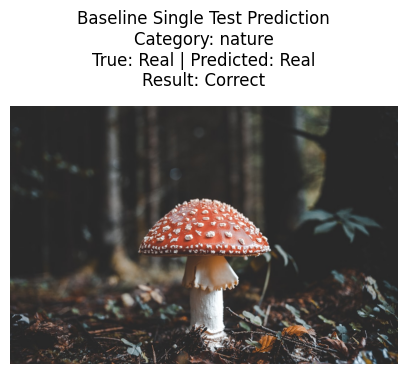

In [53]:
# Select one test image
test_index = 0
single_test_sample = X_test[test_index]

# Predict its label
single_prediction = baseline_knn.predict_one(single_test_sample)

# Get the true label
true_label = y_test[test_index]

# Load the original image from test_df for visualization
image_path = test_df.iloc[test_index]["filepath"]
category = test_df.iloc[test_index]["category"]
img = Image.open(image_path).convert("RGB")

# Check if prediction is correct
is_correct = true_label == single_prediction
result_text = "Correct" if is_correct else "Wrong"

# Print prediction details
print("Test image index:", test_index)
print("Category:", category)
print("True label:", true_label)
print("Predicted label:", single_prediction)
print("Result:", result_text)

# Display the image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title(
    f"Baseline Single Test Prediction\n"
    f"Category: {category}\n"
    f"True: {true_label} | Predicted: {single_prediction}\n"
    f"Result: {result_text}",
    fontsize=12,
    pad=14
)
plt.axis("off")
plt.show()

### 12.3 Predicting the Full Test Set

After verifying that the baseline classifier works on a single image, we use it to predict all test samples.

The output is an array of predicted labels with the same length as `y_test`.

In [54]:
# Predict labels for all test samples
baseline_y_pred = baseline_knn.predict(X_test)

print("Number of predictions:", len(baseline_y_pred))

print("\nFirst 20 predictions:")
print(baseline_y_pred[:20])

print("\nFirst 20 true labels:")
print(y_test[:20])

Number of predictions: 100

First 20 predictions:
['Real' 'Real' 'Real' 'Real' 'AI' 'Real' 'Real' 'Real' 'Real' 'Real'
 'Real' 'Real' 'Real' 'Real' 'Real' 'Real' 'Real' 'Real' 'Real' 'Real']

First 20 true labels:
['Real' 'Real' 'Real' 'AI' 'AI' 'AI' 'AI' 'Real' 'AI' 'AI' 'AI' 'AI'
 'Real' 'AI' 'Real' 'AI' 'Real' 'Real' 'AI' 'AI']


### 12.4 First Five Baseline Predictions

The assignment requires showing the first five predictions on the test set.

For each of the first five test images, we display:

- the true label
- the predicted label
- whether the prediction was correct

In [55]:
baseline_first_5_predictions = []

for i in range(5):
    baseline_first_5_predictions.append({
        "true_label": y_test[i],
        "predicted_label": baseline_y_pred[i],
        "correct": y_test[i] == baseline_y_pred[i]
    })

baseline_first_5_predictions_df = pd.DataFrame(baseline_first_5_predictions)

baseline_first_5_predictions_df

,true_label,predicted_label,correct
0,Real,Real,True
1,Real,Real,True
2,Real,Real,True
3,AI,Real,False
4,AI,AI,True


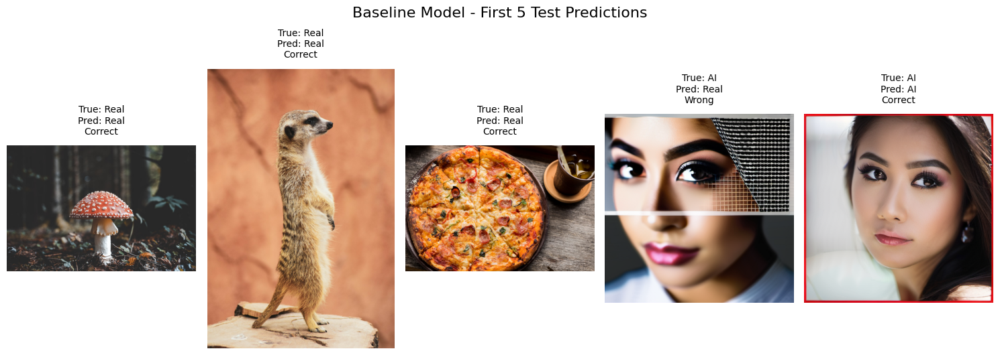

In [56]:
show_predictions(
    test_df,
    y_test,
    baseline_y_pred,
    n=5,
    title="Baseline Model - First 5 Test Predictions"
)

### 12.5 Baseline Prediction Distribution

Before calculating evaluation metrics, we compare the distribution of the predicted labels with the distribution of the true labels.

This helps us understand whether the baseline model is biased toward one class.

In [57]:
show_prediction_distribution(y_test, baseline_y_pred)

Prediction distribution:
Real    96
AI       4
Name: count, dtype: int64

True label distribution:
Real    50
AI      50
Name: count, dtype: int64


In [58]:
baseline_prediction_check_df = pd.DataFrame({
    "true_label": y_test,
    "predicted_label": baseline_y_pred,
    "correct": y_test == baseline_y_pred
})

baseline_prediction_check_df.head(15)

,true_label,predicted_label,correct
0,Real,Real,True
1,Real,Real,True
2,Real,Real,True
3,AI,Real,False
4,AI,AI,True
5,AI,Real,False
6,AI,Real,False
7,Real,Real,True
8,AI,Real,False
9,AI,Real,False


### 12.6 Baseline Evaluation Metrics

Now we evaluate the baseline predictions using the evaluation helper functions.

We calculate:

- Accuracy
- Precision
- Recall
- F1-score
- Macro F1

Macro F1 is the main metric because it gives equal importance to both classes.

In [59]:
baseline_accuracy, baseline_macro_f1, baseline_metrics_df = calculate_classification_metrics(
    y_test,
    baseline_y_pred,
    labels
)

print("Baseline Accuracy:", baseline_accuracy)
print("Baseline Macro F1:", baseline_macro_f1)

baseline_metrics_df

Baseline Accuracy: 0.48
Baseline Macro F1: 0.34043632673769664


,class,TP,FP,FN,precision,recall,f1_score
0,AI,1,3,49,0.250000,0.02,0.037037
1,Real,47,49,3,0.489583,0.94,0.643836


### 12.7 Baseline Confusion Matrix

The confusion matrix shows how many samples from each true class were classified into each predicted class.

In [60]:
baseline_confusion_df = confusion_matrix_from_scratch(
    y_test,
    baseline_y_pred,
    labels
)

baseline_confusion_df

,Predicted AI,Predicted Real
True AI,1,49
True Real,3,47


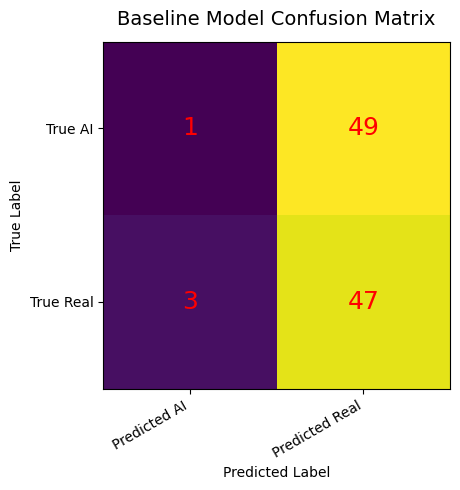

In [61]:
plot_confusion_matrix(
    baseline_confusion_df,
    title="Baseline Model Confusion Matrix"
)

### 12.8 Storing the Baseline Result

We store the baseline result in a list of experiment results.

Later, this list will be used to compare the baseline model with additional feature engineering methods and hyperparameter configurations.

In [62]:
baseline_result = {
    "experiment": "Baseline KNN",
    "feature_method": "RGB Flatten",
    "image_size": "32x32",
    "bins": "Not used",
    "k": 3,
    "distance_metric": "euclidean",
    "accuracy": baseline_accuracy,
    "macro_f1": baseline_macro_f1
}

experiments_results = [baseline_result]

pd.DataFrame(experiments_results)

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1
0,Baseline KNN,RGB Flatten,32x32,Not used,3,euclidean,0.48,0.340436


### 12.9 Baseline Experiment Summary

The baseline experiment used RGB Flatten features with a KNN classifier.

The configuration was:

- Feature method: RGB Flatten
- Image size: 32x32
- k = 3
- Distance metric = Euclidean

The baseline model achieved:

- Accuracy = 0.48
- Macro F1 = 0.3404

The prediction distribution showed that the model predicted most samples as `Real`:

- 96 samples were predicted as `Real`
- 4 samples were predicted as `AI`

Although the test set is balanced, with 50 AI-generated images and 50 real images, the baseline model was strongly biased toward the `Real` class.

The confusion matrix shows that only 1 out of 50 AI-generated images was correctly classified as `AI`, while 49 AI-generated images were incorrectly classified as `Real`.

For the `Real` class, the model correctly classified 47 out of 50 real images.

This means that the baseline model mainly learned to predict `Real`, and it performed very poorly on the `AI` class.

This result suggests that raw flattened RGB pixels are not sufficient for separating AI-generated images from real images in this dataset.

This baseline result motivates the next experiments:

- testing different KNN hyperparameters
- testing additional feature engineering methods
- using Grid Search Cross Validation to select the final model configuration

## Hyperparameter Experiments

### Note about these experiments

The following hyperparameter experiments are used as exploratory comparisons between feature representations.

The final model selection will be performed later using Grid Search with 5-Fold Cross Validation on the training set only.

The test set will be used only once at the end for the final selected model evaluation.

## 13. Hyperparameter Experiments for RGB Flatten Features

In the previous experiment, we used the first feature engineering method:

RGB Flatten

with the following KNN configuration:

- k = 3
- distance metric = Euclidean

The initial results showed that the model was strongly biased toward the `Real` class.

In this section, we test whether different KNN hyperparameters can improve the model performance.

We experiment with:

- different values of `k`
- different distance metrics

The goal is to compare multiple KNN configurations using the same feature representation.

### 13.1 Defining the Hyperparameter Grid

The hyperparameters we test are:

- `k`: the number of nearest neighbors
- `distance_metric`: the distance function used to compare image feature vectors

We use odd values of `k` to reduce the chance of ties between the two classes.

In [63]:
k_values = [1, 3, 5, 7, 9, 11]
distance_metrics = ["euclidean", "manhattan"]

print("K values:", k_values)
print("Distance metrics:", distance_metrics)
print("Total experiments:", len(k_values) * len(distance_metrics))

K values: [1, 3, 5, 7, 9, 11]
Distance metrics: ['euclidean', 'manhattan']
Total experiments: 12


### 13.2 Running the Experiments

For each combination of `k` and distance metric, we:

1. Create a KNN classifier.
2. Fit it on the training set.
3. Predict the test set.
4. Calculate accuracy and Macro F1.
5. Store the results in a table.

Macro F1 is the main comparison metric because it gives equal importance to both classes.

In [64]:
hyperparameter_results = []

for k in k_values:
    for distance_metric in distance_metrics:

        print(f"Running experiment: k={k}, distance={distance_metric}")

        # Create KNN model with the current hyperparameters
        model = KNNClassifier(k=k, distance_metric=distance_metric)

        # Store the training data in the model
        model.fit(X_train, y_train)

        # Predict the test set
        predictions = model.predict(X_test)

        # Evaluate predictions
        acc, macro, class_metrics = calculate_classification_metrics(
            y_test,
            predictions,
            labels
        )

        # Count how many predictions were made for each class
        prediction_counts = pd.Series(predictions).value_counts()

        ai_predictions = prediction_counts.get("AI", 0)
        real_predictions = prediction_counts.get("Real", 0)

        ai_f1 = class_metrics[class_metrics["class"] == "AI"]["f1_score"].values[0]
        real_f1 = class_metrics[class_metrics["class"] == "Real"]["f1_score"].values[0]

        # Store experiment result
        hyperparameter_results.append({
            "feature_method": "RGB Flatten",
            "image_size": "32x32",
            "k": k,
            "distance_metric": distance_metric,
            "accuracy": acc,
            "macro_f1": macro,
            "AI_f1": ai_f1,
            "Real_f1": real_f1,
            "predicted_AI": ai_predictions,
            "predicted_Real": real_predictions
        })

print("All experiments completed.")

Running experiment: k=1, distance=euclidean
Running experiment: k=1, distance=manhattan
Running experiment: k=3, distance=euclidean
Running experiment: k=3, distance=manhattan
Running experiment: k=5, distance=euclidean
Running experiment: k=5, distance=manhattan
Running experiment: k=7, distance=euclidean
Running experiment: k=7, distance=manhattan
Running experiment: k=9, distance=euclidean
Running experiment: k=9, distance=manhattan
Running experiment: k=11, distance=euclidean
Running experiment: k=11, distance=manhattan
All experiments completed.


### 13.3 Hyperparameter Results Table

The following table summarizes all KNN hyperparameter experiments.

For each experiment, we show:

- Feature method
- Image size
- k value
- Distance metric
- Accuracy
- Macro F1
- Number of AI predictions
- Number of Real predictions

The best configuration is selected according to Macro F1.

In [65]:
hyperparameter_results_df = pd.DataFrame(hyperparameter_results)

# Sort results by Macro F1 from highest to lowest
hyperparameter_results_df = hyperparameter_results_df.sort_values(
    by="macro_f1",
    ascending=False
).reset_index(drop=True)

hyperparameter_results_df

,feature_method,image_size,k,distance_metric,accuracy,macro_f1,AI_f1,Real_f1,predicted_AI,predicted_Real
0,RGB Flatten,32x32,1,manhattan,0.62,0.582418,0.457143,0.707692,20,80
1,RGB Flatten,32x32,1,euclidean,0.58,0.517463,0.343750,0.691176,14,86
2,RGB Flatten,32x32,7,manhattan,0.57,0.483111,0.271186,0.695035,9,91
3,RGB Flatten,32x32,5,manhattan,0.57,0.483111,0.271186,0.695035,9,91
4,RGB Flatten,32x32,9,manhattan,0.56,0.465760,0.241379,0.690141,8,92
5,RGB Flatten,32x32,3,manhattan,0.54,0.462366,0.258065,0.666667,12,88
6,RGB Flatten,32x32,11,manhattan,0.55,0.435737,0.181818,0.689655,5,95
7,RGB Flatten,32x32,5,euclidean,0.52,0.391172,0.111111,0.671233,4,96
8,RGB Flatten,32x32,9,euclidean,0.52,0.376299,0.076923,0.675676,2,98
9,RGB Flatten,32x32,7,euclidean,0.50,0.350312,0.038462,0.662162,2,98


### 13.4 Selecting the Best Hyperparameter Configuration

We select the best configuration according to the highest Macro F1-score.

Macro F1 is preferred over accuracy because our goal is to perform well on both classes, not only on the majority predicted class.

In [66]:
best_hyperparameter_result = hyperparameter_results_df.iloc[0]

print("Best hyperparameter configuration:")
print(best_hyperparameter_result)

Best hyperparameter configuration:
feature_method     RGB Flatten
image_size               32x32
k                            1
distance_metric      manhattan
accuracy                  0.62
macro_f1              0.582418
AI_f1                 0.457143
Real_f1               0.707692
predicted_AI                20
predicted_Real              80
Name: 0, dtype: object


### 13.5 Re-running the Best Hyperparameter Model

After selecting the best configuration, we train and test the KNN classifier again using the best hyperparameters.

The predictions from this model will be used for further analysis.

In [67]:
best_k = int(best_hyperparameter_result["k"])
best_distance = best_hyperparameter_result["distance_metric"]

best_knn = KNNClassifier(k=best_k, distance_metric=best_distance)
best_knn.fit(X_train, y_train)

best_y_pred = best_knn.predict(X_test)

best_accuracy, best_macro_f1, best_metrics_df = calculate_classification_metrics(
    y_test,
    best_y_pred,
    labels
)

print("Best k:", best_k)
print("Best distance metric:", best_distance)
print("Best accuracy:", best_accuracy)
print("Best Macro F1:", best_macro_f1)

best_metrics_df

Best k: 1
Best distance metric: manhattan
Best accuracy: 0.62
Best Macro F1: 0.5824175824175825


,class,TP,FP,FN,precision,recall,f1_score
0,AI,16,4,34,0.800,0.32,0.457143
1,Real,46,34,4,0.575,0.92,0.707692


In [68]:
best_confusion_df = confusion_matrix_from_scratch(
    y_test,
    best_y_pred,
    labels
)

best_confusion_df

,Predicted AI,Predicted Real
True AI,16,34
True Real,4,46


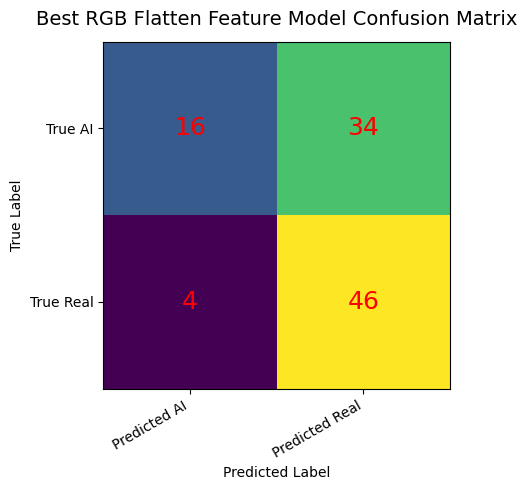

In [69]:
plot_confusion_matrix(
    best_confusion_df,
    title="Best RGB Flatten Feature Model Confusion Matrix"
)

### 13.6 Storing the Best RGB Flatten Result

After selecting and re-running the best RGB Flatten configuration, we store its result in the general experiments results list.

This allows us to compare the best RGB Flatten model with the baseline model and with additional feature engineering methods later in the project.

In [70]:
best_rgb_flatten_result = {
    "experiment": "Best RGB Flatten KNN",
    "feature_method": "RGB Flatten",
    "image_size": "32x32",
    "bins": "Not used",
    "k": best_k,
    "distance_metric": best_distance,
    "accuracy": best_accuracy,
    "macro_f1": best_macro_f1
}

# Remove previous result with the same experiment name if it exists
experiments_results = [
    result for result in experiments_results
    if result["experiment"] != "Best RGB Flatten KNN"
]

# Add the updated best RGB Flatten result
experiments_results.append(best_rgb_flatten_result)

pd.DataFrame(experiments_results)

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1
0,Baseline KNN,RGB Flatten,32x32,Not used,3,euclidean,0.48,0.340436
1,Best RGB Flatten KNN,RGB Flatten,32x32,Not used,1,manhattan,0.62,0.582418


### 13.7 RGB Flatten Hyperparameter Experiments Summary

In this section, we tested multiple KNN configurations using the RGB Flatten feature representation.

This feature method represents each image by resizing it to 32x32 pixels, normalizing the pixel values, and flattening the RGB image into a 1D vector.

Each image is represented by:

32 × 32 × 3 = 3072 features.

We evaluated:

- k values: 1, 3, 5, 7, 9, 11
- distance metrics: Euclidean and Manhattan

In total, we tested 12 different KNN configurations.

The best RGB Flatten configuration was selected according to Macro F1-score.

The best configuration was:

- k = 1
- distance metric = Manhattan

This configuration achieved:

- Accuracy = 0.62
- Macro F1 = 0.5824

Compared to the baseline configuration, which used k = 3 and Euclidean distance, the performance improved:

- Accuracy improved from 0.48 to 0.62
- Macro F1 improved from 0.3404 to 0.5824

The confusion matrix shows that the best RGB Flatten configuration improved the model's ability to identify AI-generated images.

In the baseline model, only 1 AI-generated image was correctly classified as `AI`.  
With the best RGB Flatten configuration, 16 AI-generated images were correctly classified.

However, the model is still biased toward the `Real` class.  
It correctly classified 46 out of 50 real images, but only 16 out of 50 AI-generated images.

This suggests that changing KNN hyperparameters improves performance, but RGB Flatten is still a limited feature representation for this task.

This result shows why it is important to compare RGB Flatten with additional feature engineering methods, such as Grayscale Flatten, Color Histogram, and Grayscale Histogram.

## 14. Hyperparameter Experiments for Grayscale Flatten

In this section, we test different KNN hyperparameter configurations using the Grayscale Flatten feature representation.

In this feature engineering method, each image is converted to grayscale, resized to 32x32 pixels, normalized, and flattened into a 1D vector.

Each image is represented by:

32 × 32 = 1024 features.

We test different values of:

- `k`: the number of nearest neighbors
- `distance_metric`: the distance function used by KNN

The goal is to evaluate whether grayscale flattened pixel values are useful for distinguishing between AI-generated and real images.

### 14.1 Defining the Hyperparameter Grid

For Grayscale Flatten, the feature extraction method itself does not have a `bins` parameter.

Therefore, we only test KNN hyperparameters:

- `k`
- `distance_metric`

We use odd values of `k` to reduce the chance of ties between the two classes.

In [71]:
gray_flat_k_values = [1, 3, 5, 7, 9, 11]
gray_flat_distance_metrics = ["euclidean", "manhattan"]

print("K values:", gray_flat_k_values)
print("Distance metrics:", gray_flat_distance_metrics)
print("Total experiments:", len(gray_flat_k_values) * len(gray_flat_distance_metrics))

K values: [1, 3, 5, 7, 9, 11]
Distance metrics: ['euclidean', 'manhattan']
Total experiments: 12


### 14.2 Running Grayscale Flatten Hyperparameter Experiments

For each combination of `k` and distance metric, we:

1. Create a KNN classifier.
2. Fit it on the Grayscale Flatten training features.
3. Predict the labels of the test set.
4. Calculate Accuracy and Macro F1.
5. Store the results in a DataFrame.

Macro F1 is used as the main comparison metric because it gives equal importance to both classes: `AI` and `Real`.

In [72]:
grayscale_flatten_results = []

for k in gray_flat_k_values:
    for distance_metric in gray_flat_distance_metrics:

        print(f"Running Grayscale Flatten experiment: k={k}, distance={distance_metric}")

        # Create KNN model with the current hyperparameters
        model = KNNClassifier(
            k=k,
            distance_metric=distance_metric
        )

        # Store the Grayscale Flatten training data in the model
        model.fit(X_train_gray_flat, y_train_gray_flat)

        # Predict the test set using Grayscale Flatten features
        predictions = model.predict(X_test_gray_flat)

        # Evaluate predictions
        acc, macro, class_metrics = calculate_classification_metrics(
            y_test_gray_flat,
            predictions,
            labels
        )

        # Count how many predictions were made for each class
        prediction_counts = pd.Series(predictions).value_counts()

        ai_predictions = prediction_counts.get("AI", 0)
        real_predictions = prediction_counts.get("Real", 0)

        # Extract per-class F1 scores for easier comparison
        ai_f1 = class_metrics[class_metrics["class"] == "AI"]["f1_score"].values[0]
        real_f1 = class_metrics[class_metrics["class"] == "Real"]["f1_score"].values[0]

        # Store experiment result
        grayscale_flatten_results.append({
            "experiment": "Grayscale Flatten KNN",
            "feature_method": "Grayscale Flatten",
            "image_size": "32x32",
            "bins": "Not used",
            "k": k,
            "distance_metric": distance_metric,
            "accuracy": acc,
            "macro_f1": macro,
            "AI_f1": ai_f1,
            "Real_f1": real_f1,
            "predicted_AI": ai_predictions,
            "predicted_Real": real_predictions
        })

print("All Grayscale Flatten experiments completed.")

Running Grayscale Flatten experiment: k=1, distance=euclidean
Running Grayscale Flatten experiment: k=1, distance=manhattan
Running Grayscale Flatten experiment: k=3, distance=euclidean
Running Grayscale Flatten experiment: k=3, distance=manhattan
Running Grayscale Flatten experiment: k=5, distance=euclidean
Running Grayscale Flatten experiment: k=5, distance=manhattan
Running Grayscale Flatten experiment: k=7, distance=euclidean
Running Grayscale Flatten experiment: k=7, distance=manhattan
Running Grayscale Flatten experiment: k=9, distance=euclidean
Running Grayscale Flatten experiment: k=9, distance=manhattan
Running Grayscale Flatten experiment: k=11, distance=euclidean
Running Grayscale Flatten experiment: k=11, distance=manhattan
All Grayscale Flatten experiments completed.


### 14.3 Grayscale Flatten Hyperparameter Results

The following table summarizes all Grayscale Flatten hyperparameter experiments.

Each row represents one KNN configuration.

For each experiment, we show:

 - Feature method
 - Image size
 - k value
 - Distance metric
 - Accuracy
 - Macro F1
 - Number of AI predictions
 - Number of Real predictions

The table is sorted by Macro F1-score, from highest to lowest.

In [73]:
grayscale_flatten_results_df = pd.DataFrame(grayscale_flatten_results)

# Sort by Macro F1 from highest to lowest
grayscale_flatten_results_df = grayscale_flatten_results_df.sort_values(
    by="macro_f1",
    ascending=False
).reset_index(drop=True)

grayscale_flatten_results_df

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1,AI_f1,Real_f1,predicted_AI,predicted_Real
0,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,1,manhattan,0.58,0.532086,0.382353,0.681818,18,82
1,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,3,manhattan,0.58,0.517463,0.343750,0.691176,14,86
2,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,1,euclidean,0.56,0.494485,0.312500,0.676471,14,86
3,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,5,manhattan,0.57,0.472457,0.245614,0.699301,7,93
4,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,7,manhattan,0.56,0.454365,0.214286,0.694444,6,94
5,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,9,manhattan,0.55,0.435737,0.181818,0.689655,5,95
6,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,11,manhattan,0.52,0.376299,0.076923,0.675676,2,98
7,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,5,euclidean,0.52,0.376299,0.076923,0.675676,2,98
8,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,3,euclidean,0.50,0.365804,0.074074,0.657534,4,96
9,Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,7,euclidean,0.51,0.355178,0.039216,0.671141,1,99


### 14.4 Selecting the Best Grayscale Flatten Configuration

We select the best Grayscale Flatten configuration according to the highest Macro F1-score.

Macro F1 is preferred over Accuracy because the model should perform well on both classes, not only on one class.

In [74]:
best_gray_flat_result = grayscale_flatten_results_df.iloc[0]

print("Best Grayscale Flatten configuration:")
print(best_gray_flat_result)

Best Grayscale Flatten configuration:
experiment         Grayscale Flatten KNN
feature_method         Grayscale Flatten
image_size                         32x32
bins                            Not used
k                                      1
distance_metric                manhattan
accuracy                            0.58
macro_f1                        0.532086
AI_f1                           0.382353
Real_f1                         0.681818
predicted_AI                          18
predicted_Real                        82
Name: 0, dtype: object


### 14.5 Re-running the Best Grayscale Flatten Model

After selecting the best Grayscale Flatten configuration, we train and test the KNN classifier again using the best hyperparameters.

This allows us to analyze the best Grayscale Flatten model in more detail.

In [75]:
best_gray_flat_k = int(best_gray_flat_result["k"])
best_gray_flat_distance = best_gray_flat_result["distance_metric"]

print("Best k:", best_gray_flat_k)
print("Best distance metric:", best_gray_flat_distance)

# Create and train the best Grayscale Flatten KNN model
best_gray_flat_knn = KNNClassifier(
    k=best_gray_flat_k,
    distance_metric=best_gray_flat_distance
)

best_gray_flat_knn.fit(X_train_gray_flat, y_train_gray_flat)

# Predict the test set
best_gray_flat_y_pred = best_gray_flat_knn.predict(X_test_gray_flat)

# Evaluate the best model
best_gray_flat_accuracy, best_gray_flat_macro_f1, best_gray_flat_metrics_df = calculate_classification_metrics(
    y_test_gray_flat,
    best_gray_flat_y_pred,
    labels
)

print("Best Grayscale Flatten Accuracy:", best_gray_flat_accuracy)
print("Best Grayscale Flatten Macro F1:", best_gray_flat_macro_f1)

best_gray_flat_metrics_df

Best k: 1
Best distance metric: manhattan
Best Grayscale Flatten Accuracy: 0.58
Best Grayscale Flatten Macro F1: 0.5320855614973262


,class,TP,FP,FN,precision,recall,f1_score
0,AI,13,5,37,0.722222,0.26,0.382353
1,Real,45,37,5,0.548780,0.90,0.681818


In [76]:
best_gray_flat_confusion_df = confusion_matrix_from_scratch(
    y_test_gray_flat,
    best_gray_flat_y_pred,
    labels
)

best_gray_flat_confusion_df

,Predicted AI,Predicted Real
True AI,13,37
True Real,5,45


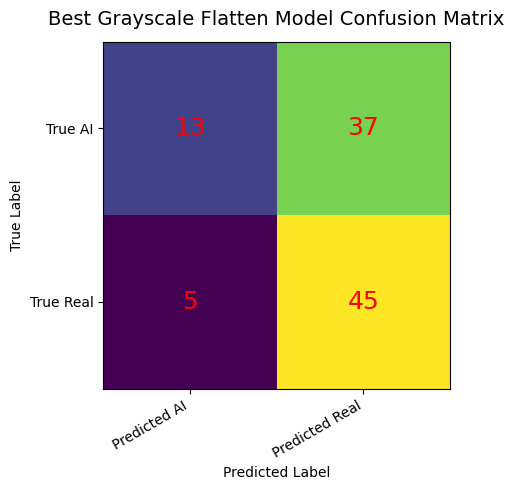

In [77]:
plot_confusion_matrix(
    best_gray_flat_confusion_df,
    title="Best Grayscale Flatten Model Confusion Matrix"
)

### 14.6 Storing the Best Grayscale Flatten Result

We store the best Grayscale Flatten result in the experiment results list.

Later, this will allow us to compare all feature engineering methods in one final table.

In [78]:
best_grayscale_flatten_result = {
    "experiment": "Best Grayscale Flatten KNN",
    "feature_method": "Grayscale Flatten",
    "image_size": "32x32",
    "bins": "Not used",
    "k": best_gray_flat_k,
    "distance_metric": best_gray_flat_distance,
    "accuracy": best_gray_flat_accuracy,
    "macro_f1": best_gray_flat_macro_f1
}

# Remove previous result with the same experiment name if it exists
experiments_results = [
    result for result in experiments_results
    if result["experiment"] != "Best Grayscale Flatten KNN"
]

# Add the updated best result
experiments_results.append(best_grayscale_flatten_result)

pd.DataFrame(experiments_results)

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1
0,Baseline KNN,RGB Flatten,32x32,Not used,3,euclidean,0.48,0.340436
1,Best RGB Flatten KNN,RGB Flatten,32x32,Not used,1,manhattan,0.62,0.582418
2,Best Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,1,manhattan,0.58,0.532086


### 14.7 Grayscale Flatten Hyperparameter Experiments Summary

In this section, we tested multiple KNN configurations using the Grayscale Flatten feature representation.

In this feature engineering method, each image is converted to grayscale, resized to 32x32 pixels, normalized, and flattened into a 1D vector.

Each image is represented by:

32 × 32 = 1024 features.

We evaluated:

- k values: 1, 3, 5, 7, 9, 11
- distance metrics: Euclidean and Manhattan

In total, we tested 12 different KNN configurations.

The best Grayscale Flatten configuration was selected according to Macro F1-score.

The best configuration was:

- k = 1
- distance metric = Manhattan

This configuration achieved:

- Accuracy = 0.58
- Macro F1 = 0.5321

The confusion matrix shows that the model correctly classified:

- 13 out of 50 AI-generated images
- 45 out of 50 real images

Compared to RGB Flatten, Grayscale Flatten uses fewer features:

- RGB Flatten: 3072 features
- Grayscale Flatten: 1024 features

However, the best Grayscale Flatten model performed slightly worse than the best RGB Flatten model:

- RGB Flatten Macro F1 = 0.5824
- Grayscale Flatten Macro F1 = 0.5321

This suggests that removing color information did not improve the flattened pixel representation for this dataset.

The result indicates that RGB color information may still contribute useful information when using raw flattened pixels.

The best Grayscale Flatten result was stored in the general `experiments_results` list so it can later be compared with the other feature engineering methods:

- RGB Flatten
- Color Histogram
- Grayscale Histogram

## 15. Hyperparameter Experiments for Color Histogram

In this section, we perform a wider hyperparameter experiment for the Color Histogram feature representation.

Color Histogram represents each image using the distribution of RGB pixel intensities instead of raw pixel positions.

We test:

- different values of `k`
- different distance metrics
- different numbers of histogram bins

The goal is to find a strong exploratory configuration for Color Histogram and compare it with the other feature engineering methods.

This experiment is part of the exploratory comparison between feature representations.

The final model selection will be performed later using Grid Search Cross Validation on the training set only.

### 15.1 Defining the Hyperparameter Grid

For this experiment, we test three types of hyperparameters:

1. `k`: the number of nearest neighbors used by KNN.
2. `distance_metric`: the distance function used to compare samples.
3. `bins`: the number of bins used in the color histogram.

The number of bins controls how detailed the color histogram is.

A smaller number of bins gives a more general color representation.  
A larger number of bins gives a more detailed color representation.

This experiment uses a full Cartesian product of the selected hyperparameters:
6 k values × 2 distance metrics × 3 bins values = 36 configurations.

In [79]:
color_hist_k_values = [1, 3, 5, 7, 9, 11]
color_hist_distance_metrics = ["euclidean", "manhattan"]
color_hist_bins_values = [8, 16, 32]

total_experiments = len(k_values) * len(distance_metrics) * len(color_hist_bins_values)

print("K values:", k_values)
print("Distance metrics:", distance_metrics)
print("Bins values:", color_hist_bins_values)
print("Total experiments:", total_experiments)

K values: [1, 3, 5, 7, 9, 11]
Distance metrics: ['euclidean', 'manhattan']
Bins values: [8, 16, 32]
Total experiments: 36


### 15.2 Running Color Histogram Hyperparameter Experiments

For each value of `bins`, we first build new color histogram feature matrices.

Then, for each combination of `k` and distance metric, we:

1. Create a KNN classifier.
2. Fit it on the training histogram features.
3. Predict the test histogram features.
4. Calculate accuracy and Macro F1.
5. Store the results in a comparison table.

Macro F1 is used as the main metric because it gives equal importance to both classes.

In [80]:
color_histogram_experiment_results = []

for bins in color_hist_bins_values:

    print(f"\nBuilding color histogram features with bins={bins}")

    # Build color histogram feature matrices for the current bins value
    X_train_hist, y_train_hist = build_color_histogram_matrix(
        train_df,
        image_size=(64, 64),
        bins=bins
    )

    X_test_hist, y_test_hist = build_color_histogram_matrix(
        test_df,
        image_size=(64, 64),
        bins=bins
    )

    print("X_train_hist shape:", X_train_hist.shape)
    print("X_test_hist shape:", X_test_hist.shape)

    for k in color_hist_k_values:
        for distance_metric in color_hist_distance_metrics:

            print(f"Running experiment: bins={bins}, k={k}, distance={distance_metric}")

            # Create KNN model with the current hyperparameters
            model = KNNClassifier(
                k=k,
                distance_metric=distance_metric
            )

            # Store the training data in the model
            model.fit(X_train_hist, y_train_hist)

            # Predict the test set
            predictions = model.predict(X_test_hist)

            # Evaluate predictions
            acc, macro, class_metrics = calculate_classification_metrics(
                y_test_hist,
                predictions,
                labels
            )

            # Count predicted labels
            prediction_counts = pd.Series(predictions).value_counts()

            ai_predictions = prediction_counts.get("AI", 0)
            real_predictions = prediction_counts.get("Real", 0)

            # Extract per-class F1 scores for easier comparison
            ai_f1 = class_metrics[class_metrics["class"] == "AI"]["f1_score"].values[0]
            real_f1 = class_metrics[class_metrics["class"] == "Real"]["f1_score"].values[0]

            # Store experiment result
            color_histogram_experiment_results.append({
                "experiment": "Color Histogram KNN",
                "feature_method": "Color Histogram",
                "image_size": "64x64",
                "bins": bins,
                "k": k,
                "distance_metric": distance_metric,
                "accuracy": acc,
                "macro_f1": macro,
                "AI_f1": ai_f1,
                "Real_f1": real_f1,
                "predicted_AI": ai_predictions,
                "predicted_Real": real_predictions
            })

print("\nAll Color Histogram experiments completed.")


Building color histogram features with bins=8
X_train_hist shape: (400, 24)
X_test_hist shape: (100, 24)
Running experiment: bins=8, k=1, distance=euclidean
Running experiment: bins=8, k=1, distance=manhattan
Running experiment: bins=8, k=3, distance=euclidean
Running experiment: bins=8, k=3, distance=manhattan
Running experiment: bins=8, k=5, distance=euclidean
Running experiment: bins=8, k=5, distance=manhattan
Running experiment: bins=8, k=7, distance=euclidean
Running experiment: bins=8, k=7, distance=manhattan
Running experiment: bins=8, k=9, distance=euclidean
Running experiment: bins=8, k=9, distance=manhattan
Running experiment: bins=8, k=11, distance=euclidean
Running experiment: bins=8, k=11, distance=manhattan

Building color histogram features with bins=16
X_train_hist shape: (400, 48)
X_test_hist shape: (100, 48)
Running experiment: bins=16, k=1, distance=euclidean
Running experiment: bins=16, k=1, distance=manhattan
Running experiment: bins=16, k=3, distance=euclidean
Ru

### 15.3 Color Histogram Hyperparameter Results

The following table summarizes all Color Histogram hyperparameter experiments.

Each row represents one configuration of:

- bins
- k
- distance metric

The table is sorted by Macro F1, from highest to lowest.

In [81]:
color_histogram_results_df = pd.DataFrame(color_histogram_experiment_results)

# Sort by Macro F1 from highest to lowest
color_histogram_results_df = color_histogram_results_df.sort_values(
    by="macro_f1",
    ascending=False
).reset_index(drop=True)

color_histogram_results_df

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1,AI_f1,Real_f1,predicted_AI,predicted_Real
0,Color Histogram KNN,Color Histogram,64x64,8,5,manhattan,0.86,0.859776,0.865385,0.854167,54,46
1,Color Histogram KNN,Color Histogram,64x64,16,9,manhattan,0.86,0.859494,0.867925,0.851064,56,44
2,Color Histogram KNN,Color Histogram,64x64,16,5,euclidean,0.85,0.849865,0.854369,0.845361,53,47
3,Color Histogram KNN,Color Histogram,64x64,32,7,manhattan,0.85,0.849865,0.854369,0.845361,53,47
4,Color Histogram KNN,Color Histogram,64x64,16,3,euclidean,0.84,0.840000,0.840000,0.840000,50,50
5,Color Histogram KNN,Color Histogram,64x64,32,9,manhattan,0.84,0.839936,0.843137,0.836735,52,48
6,Color Histogram KNN,Color Histogram,64x64,32,3,manhattan,0.84,0.839936,0.843137,0.836735,52,48
7,Color Histogram KNN,Color Histogram,64x64,16,5,manhattan,0.84,0.839744,0.846154,0.833333,54,46
8,Color Histogram KNN,Color Histogram,64x64,16,3,manhattan,0.84,0.839744,0.846154,0.833333,54,46
9,Color Histogram KNN,Color Histogram,64x64,32,5,manhattan,0.84,0.839744,0.846154,0.833333,54,46


### 15.4 Selecting the Best Color Histogram Configuration

We select the best Color Histogram configuration according to the highest Macro F1-score.

Macro F1 is used because it evaluates the model performance on both classes equally.

In [82]:
best_color_hist_result = color_histogram_results_df.iloc[0]

print("Best Color Histogram configuration:")
print(best_color_hist_result)

Best Color Histogram configuration:
experiment         Color Histogram KNN
feature_method         Color Histogram
image_size                       64x64
bins                                 8
k                                    5
distance_metric              manhattan
accuracy                          0.86
macro_f1                      0.859776
AI_f1                         0.865385
Real_f1                       0.854167
predicted_AI                        54
predicted_Real                      46
Name: 0, dtype: object


### 15.5 Re-running the Best Color Histogram Model

After selecting the best Color Histogram configuration, we rebuild the histogram features using the best number of bins.

Then, we train and test the KNN classifier again using the best `k` and distance metric.

This allows us to analyze the best Color Histogram model in detail.

In [83]:
best_hist_bins = int(best_color_hist_result["bins"])
best_hist_k = int(best_color_hist_result["k"])
best_hist_distance = best_color_hist_result["distance_metric"]

print("Best bins:", best_hist_bins)
print("Best k:", best_hist_k)
print("Best distance metric:", best_hist_distance)

# Rebuild histogram features with the best bins value
X_train_hist_best, y_train_hist_best = build_color_histogram_matrix(
    train_df,
    image_size=(64, 64),
    bins=best_hist_bins
)

X_test_hist_best, y_test_hist_best = build_color_histogram_matrix(
    test_df,
    image_size=(64, 64),
    bins=best_hist_bins
)

# Create and train the best KNN model
best_hist_knn = KNNClassifier(
    k=best_hist_k,
    distance_metric=best_hist_distance
)

best_hist_knn.fit(X_train_hist_best, y_train_hist_best)

# Predict the test set
best_hist_y_pred = best_hist_knn.predict(X_test_hist_best)

# Evaluate the best model
best_hist_accuracy, best_hist_macro_f1, best_hist_metrics_df = calculate_classification_metrics(
    y_test_hist_best,
    best_hist_y_pred,
    labels
)

print("Best Color Histogram Accuracy:", best_hist_accuracy)
print("Best Color Histogram Macro F1:", best_hist_macro_f1)

best_hist_metrics_df

Best bins: 8
Best k: 5
Best distance metric: manhattan
Best Color Histogram Accuracy: 0.86
Best Color Histogram Macro F1: 0.859775641025641


,class,TP,FP,FN,precision,recall,f1_score
0,AI,45,9,5,0.833333,0.90,0.865385
1,Real,41,5,9,0.891304,0.82,0.854167


In [84]:
best_hist_confusion_df = confusion_matrix_from_scratch(
    y_test_hist_best,
    best_hist_y_pred,
    labels
)

best_hist_confusion_df

,Predicted AI,Predicted Real
True AI,45,5
True Real,9,41


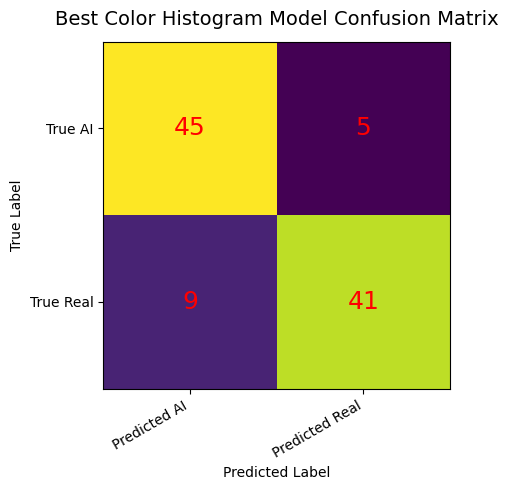

In [85]:
plot_confusion_matrix(
    best_hist_confusion_df,
    title="Best Color Histogram Model Confusion Matrix"
)

### 15.6 Adding the Best Color Histogram Result to the Experiments Table

We add the best Color Histogram result to the general experiments table.

This table allows us to compare the baseline model, the best flattened pixel model, and the best Color Histogram model.

In [86]:
best_color_histogram_result = {
    "experiment": "Best Color Histogram KNN",
    "feature_method": "Color Histogram",
    "image_size": "64x64",
    "bins": best_hist_bins,
    "k": best_hist_k,
    "distance_metric": best_hist_distance,
    "accuracy": best_hist_accuracy,
    "macro_f1": best_hist_macro_f1
}

# Remove previous result with the same experiment name if it exists
experiments_results = [
    result for result in experiments_results
    if result["experiment"] not in ["Best Color Histogram KNN"]
]

# Add the updated best result
experiments_results.append(best_color_histogram_result)

final_experiments_df = pd.DataFrame(experiments_results)

final_experiments_df

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1
0,Baseline KNN,RGB Flatten,32x32,Not used,3,euclidean,0.48,0.340436
1,Best RGB Flatten KNN,RGB Flatten,32x32,Not used,1,manhattan,0.62,0.582418
2,Best Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,1,manhattan,0.58,0.532086
3,Best Color Histogram KNN,Color Histogram,64x64,8,5,manhattan,0.86,0.859776


### 15.7 Color Histogram Hyperparameter Experiments Summary

In this section, we tested multiple Color Histogram configurations in order to find the best combination of feature extraction parameters and KNN hyperparameters.

We evaluated:

- k values: 1, 3, 5, 7, 9, 11
- distance metrics: Euclidean and Manhattan
- bins values: 8, 16, 32

In total, we tested 36 different configurations.

The best Color Histogram configuration in this exploratory test-set experiment was:

- bins = 8
- k = 5
- distance metric = Manhattan

This configuration achieved:

- Accuracy = 0.86
- Macro F1 = 0.8598

The confusion matrix shows that the model correctly classified:

- 45 out of 50 AI-generated images
- 41 out of 50 real images

Compared to the original baseline model, which used RGB Flatten with k = 3 and Euclidean distance, the performance improved significantly:

- Accuracy improved from 0.48 to 0.86
- Macro F1 improved from 0.3404 to 0.8598

These results show that Color Histogram is a much stronger feature representation for this dataset than raw flattened pixels.

The improvement suggests that the color distribution of the images contains useful information for distinguishing between AI-generated and real images.

Interestingly, the best exploratory test-set result used 8 bins, which means that a more general color distribution was enough to capture useful differences between the two classes.

Overall, this experiment shows that both feature engineering and hyperparameter tuning had a major impact on the model performance.

However, the final model will not be selected directly from this test-set experiment.  
The final configuration will be selected using Grid Search Cross Validation on the training set only.

## 16. Hyperparameter Experiments for Grayscale Histogram

In this section, we test different KNN and feature engineering hyperparameter configurations using the Grayscale Histogram feature representation.

In this method, each image is converted to grayscale and represented by a histogram of brightness values.

Unlike Grayscale Flatten, this method does not preserve the exact position of pixels.  
Instead, it describes how brightness values are distributed across the image.

We test different values of:

- `bins`: number of histogram bins
- `k`: number of nearest neighbors
- `distance_metric`: distance function used by KNN

The goal is to evaluate whether brightness distribution is useful for distinguishing between AI-generated and real images.

### 16.1 Defining the Hyperparameter Grid

For Grayscale Histogram, we test both feature engineering parameters and KNN hyperparameters.

The tested parameters are:

- `bins`: controls how detailed the grayscale histogram is.
- `k`: controls how many nearest neighbors are used by KNN.
- `distance_metric`: controls how distance between samples is calculated.

If `bins = 8`, each image is represented by 8 features.  
If `bins = 16`, each image is represented by 16 features.  
If `bins = 32`, each image is represented by 32 features.

In [87]:
gray_hist_k_values = [1, 3, 5, 7, 9, 11]
gray_hist_distance_metrics = ["euclidean", "manhattan"]
gray_hist_bins_values = [8, 16, 32]

total_gray_hist_experiments = (
    len(gray_hist_k_values)
    * len(gray_hist_distance_metrics)
    * len(gray_hist_bins_values)
)

print("K values:", gray_hist_k_values)
print("Distance metrics:", gray_hist_distance_metrics)
print("Bins values:", gray_hist_bins_values)
print("Total experiments:", total_gray_hist_experiments)

K values: [1, 3, 5, 7, 9, 11]
Distance metrics: ['euclidean', 'manhattan']
Bins values: [8, 16, 32]
Total experiments: 36


### 16.2 Running Grayscale Histogram Hyperparameter Experiments

For each value of `bins`, we first build new Grayscale Histogram feature matrices.

Then, for each combination of `k` and distance metric, we:

1. Create a KNN classifier.
2. Fit it on the Grayscale Histogram training features.
3. Predict the labels of the test set.
4. Calculate Accuracy and Macro F1.
5. Store the results in a DataFrame.

Macro F1 is used as the main comparison metric because it gives equal importance to both classes.

In [88]:
grayscale_histogram_results = []

for bins in gray_hist_bins_values:

    print(f"\nBuilding Grayscale Histogram features with bins={bins}")

    # Build Grayscale Histogram feature matrices for the current bins value
    X_train_gray_hist_current, y_train_gray_hist_current = build_grayscale_histogram_matrix(
        train_df,
        image_size=(64, 64),
        bins=bins
    )

    X_test_gray_hist_current, y_test_gray_hist_current = build_grayscale_histogram_matrix(
        test_df,
        image_size=(64, 64),
        bins=bins
    )

    print("X_train_gray_hist shape:", X_train_gray_hist_current.shape)
    print("X_test_gray_hist shape:", X_test_gray_hist_current.shape)

    for k in gray_hist_k_values:
        for distance_metric in gray_hist_distance_metrics:

            print(f"Running experiment: bins={bins}, k={k}, distance={distance_metric}")

            # Create KNN model with the current hyperparameters
            model = KNNClassifier(
                k=k,
                distance_metric=distance_metric
            )

            # Store the training data in the model
            model.fit(X_train_gray_hist_current, y_train_gray_hist_current)

            # Predict the test set
            predictions = model.predict(X_test_gray_hist_current)

            # Evaluate predictions
            acc, macro, class_metrics = calculate_classification_metrics(
                y_test_gray_hist_current,
                predictions,
                labels
            )

            # Count predicted labels
            prediction_counts = pd.Series(predictions).value_counts()

            ai_predictions = prediction_counts.get("AI", 0)
            real_predictions = prediction_counts.get("Real", 0)

            # Extract per-class F1 scores
            ai_f1 = class_metrics[class_metrics["class"] == "AI"]["f1_score"].values[0]
            real_f1 = class_metrics[class_metrics["class"] == "Real"]["f1_score"].values[0]

            # Store experiment result
            grayscale_histogram_results.append({
                "experiment": "Grayscale Histogram KNN",
                "feature_method": "Grayscale Histogram",
                "image_size": "64x64",
                "bins": bins,
                "k": k,
                "distance_metric": distance_metric,
                "accuracy": acc,
                "macro_f1": macro,
                "AI_f1": ai_f1,
                "Real_f1": real_f1,
                "predicted_AI": ai_predictions,
                "predicted_Real": real_predictions
            })

print("\nAll Grayscale Histogram experiments completed.")


Building Grayscale Histogram features with bins=8
X_train_gray_hist shape: (400, 8)
X_test_gray_hist shape: (100, 8)
Running experiment: bins=8, k=1, distance=euclidean
Running experiment: bins=8, k=1, distance=manhattan
Running experiment: bins=8, k=3, distance=euclidean
Running experiment: bins=8, k=3, distance=manhattan
Running experiment: bins=8, k=5, distance=euclidean
Running experiment: bins=8, k=5, distance=manhattan
Running experiment: bins=8, k=7, distance=euclidean
Running experiment: bins=8, k=7, distance=manhattan
Running experiment: bins=8, k=9, distance=euclidean
Running experiment: bins=8, k=9, distance=manhattan
Running experiment: bins=8, k=11, distance=euclidean
Running experiment: bins=8, k=11, distance=manhattan

Building Grayscale Histogram features with bins=16
X_train_gray_hist shape: (400, 16)
X_test_gray_hist shape: (100, 16)
Running experiment: bins=16, k=1, distance=euclidean
Running experiment: bins=16, k=1, distance=manhattan
Running experiment: bins=16, 

### 16.3 Grayscale Histogram Hyperparameter Results

The following table summarizes all Grayscale Histogram hyperparameter experiments.

Each row represents one configuration of:

- bins
- k
- distance metric

The table is sorted by Macro F1-score, from highest to lowest.

In [89]:
grayscale_histogram_results_df = pd.DataFrame(grayscale_histogram_results)

# Sort by Macro F1 from highest to lowest
grayscale_histogram_results_df = grayscale_histogram_results_df.sort_values(
    by="macro_f1",
    ascending=False
).reset_index(drop=True)

grayscale_histogram_results_df

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1,AI_f1,Real_f1,predicted_AI,predicted_Real
0,Grayscale Histogram KNN,Grayscale Histogram,64x64,32,11,manhattan,0.80,0.799920,0.795918,0.803922,48,52
1,Grayscale Histogram KNN,Grayscale Histogram,64x64,16,11,manhattan,0.78,0.780000,0.780000,0.780000,50,50
2,Grayscale Histogram KNN,Grayscale Histogram,64x64,32,9,manhattan,0.77,0.769977,0.767677,0.772277,49,51
3,Grayscale Histogram KNN,Grayscale Histogram,64x64,16,9,manhattan,0.77,0.769793,0.776699,0.762887,53,47
4,Grayscale Histogram KNN,Grayscale Histogram,64x64,32,7,manhattan,0.77,0.769424,0.757895,0.780952,45,55
5,Grayscale Histogram KNN,Grayscale Histogram,64x64,8,5,manhattan,0.75,0.749975,0.747475,0.752475,49,51
6,Grayscale Histogram KNN,Grayscale Histogram,64x64,8,7,manhattan,0.75,0.749975,0.747475,0.752475,49,51
7,Grayscale Histogram KNN,Grayscale Histogram,64x64,16,3,manhattan,0.75,0.749373,0.736842,0.761905,45,55
8,Grayscale Histogram KNN,Grayscale Histogram,64x64,8,9,manhattan,0.74,0.739896,0.745098,0.734694,52,48
9,Grayscale Histogram KNN,Grayscale Histogram,64x64,8,11,manhattan,0.74,0.739896,0.745098,0.734694,52,48


### 16.4 Selecting the Best Grayscale Histogram Configuration

We select the best Grayscale Histogram configuration according to the highest Macro F1-score.

Macro F1 is used because it evaluates the model performance on both classes equally.

In [90]:
best_gray_hist_result = grayscale_histogram_results_df.iloc[0]

print("Best Grayscale Histogram configuration:")
print(best_gray_hist_result)

Best Grayscale Histogram configuration:
experiment         Grayscale Histogram KNN
feature_method         Grayscale Histogram
image_size                           64x64
bins                                    32
k                                       11
distance_metric                  manhattan
accuracy                               0.8
macro_f1                           0.79992
AI_f1                             0.795918
Real_f1                           0.803922
predicted_AI                            48
predicted_Real                          52
Name: 0, dtype: object


### 16.5 Re-running the Best Grayscale Histogram Model

After selecting the best Grayscale Histogram configuration, we rebuild the histogram features using the best number of bins.

Then, we train and test the KNN classifier again using the best `k` and distance metric.

In [91]:
best_gray_hist_bins = int(best_gray_hist_result["bins"])
best_gray_hist_k = int(best_gray_hist_result["k"])
best_gray_hist_distance = best_gray_hist_result["distance_metric"]

print("Best bins:", best_gray_hist_bins)
print("Best k:", best_gray_hist_k)
print("Best distance metric:", best_gray_hist_distance)

# Rebuild Grayscale Histogram features with the best bins value
X_train_gray_hist_best, y_train_gray_hist_best = build_grayscale_histogram_matrix(
    train_df,
    image_size=(64, 64),
    bins=best_gray_hist_bins
)

X_test_gray_hist_best, y_test_gray_hist_best = build_grayscale_histogram_matrix(
    test_df,
    image_size=(64, 64),
    bins=best_gray_hist_bins
)

# Create and train the best Grayscale Histogram KNN model
best_gray_hist_knn = KNNClassifier(
    k=best_gray_hist_k,
    distance_metric=best_gray_hist_distance
)

best_gray_hist_knn.fit(X_train_gray_hist_best, y_train_gray_hist_best)

# Predict the test set
best_gray_hist_y_pred = best_gray_hist_knn.predict(X_test_gray_hist_best)

# Evaluate the best model
best_gray_hist_accuracy, best_gray_hist_macro_f1, best_gray_hist_metrics_df = calculate_classification_metrics(
    y_test_gray_hist_best,
    best_gray_hist_y_pred,
    labels
)

print("Best Grayscale Histogram Accuracy:", best_gray_hist_accuracy)
print("Best Grayscale Histogram Macro F1:", best_gray_hist_macro_f1)

best_gray_hist_metrics_df

Best bins: 32
Best k: 11
Best distance metric: manhattan
Best Grayscale Histogram Accuracy: 0.8
Best Grayscale Histogram Macro F1: 0.7999199679871949


,class,TP,FP,FN,precision,recall,f1_score
0,AI,39,9,11,0.812500,0.78,0.795918
1,Real,41,11,9,0.788462,0.82,0.803922


In [92]:
best_gray_hist_confusion_df = confusion_matrix_from_scratch(
    y_test_gray_hist_best,
    best_gray_hist_y_pred,
    labels
)

best_gray_hist_confusion_df

,Predicted AI,Predicted Real
True AI,39,11
True Real,9,41


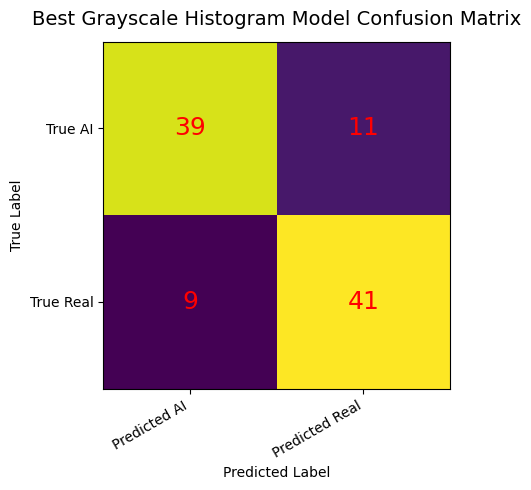

In [93]:
plot_confusion_matrix(
    best_gray_hist_confusion_df,
    title="Best Grayscale Histogram Model Confusion Matrix"
)

### 16.6 Storing the Best Grayscale Histogram Result

We store the best Grayscale Histogram result in the experiment results list.

Later, this will allow us to compare all feature engineering methods in one final table.

In [94]:
best_grayscale_histogram_result = {
    "experiment": "Best Grayscale Histogram KNN",
    "feature_method": "Grayscale Histogram",
    "image_size": "64x64",
    "bins": best_gray_hist_bins,
    "k": best_gray_hist_k,
    "distance_metric": best_gray_hist_distance,
    "accuracy": best_gray_hist_accuracy,
    "macro_f1": best_gray_hist_macro_f1
}

# Remove previous result with the same experiment name if it exists
experiments_results = [
    result for result in experiments_results
    if result["experiment"] != "Best Grayscale Histogram KNN"
]

# Add the updated best result
experiments_results.append(best_grayscale_histogram_result)

pd.DataFrame(experiments_results)

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1
0,Baseline KNN,RGB Flatten,32x32,Not used,3,euclidean,0.48,0.340436
1,Best RGB Flatten KNN,RGB Flatten,32x32,Not used,1,manhattan,0.62,0.582418
2,Best Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,1,manhattan,0.58,0.532086
3,Best Color Histogram KNN,Color Histogram,64x64,8,5,manhattan,0.86,0.859776
4,Best Grayscale Histogram KNN,Grayscale Histogram,64x64,32,11,manhattan,0.80,0.799920


### 16.8 Grayscale Histogram Hyperparameter Experiments Summary

In this section, we tested multiple KNN configurations using the Grayscale Histogram feature representation.

In this feature engineering method, each image is converted to grayscale and represented using a histogram of brightness values.

Unlike Grayscale Flatten, this method does not preserve the exact position of pixels.  
Instead, it describes the overall distribution of dark, medium, and bright pixels in the image.

We evaluated:

- bins values: 8, 16, 32
- k values: 1, 3, 5, 7, 9, 11
- distance metrics: Euclidean and Manhattan

In total, we tested 36 different configurations.

The best Grayscale Histogram configuration was:

- bins = 32
- k = 11
- distance metric = Manhattan

This configuration achieved:

- Accuracy = 0.80
- Macro F1 = 0.7999

The confusion matrix shows that the model correctly classified:

- 39 out of 50 AI-generated images
- 41 out of 50 real images

Compared to Grayscale Flatten, Grayscale Histogram performed much better:

- Grayscale Flatten Macro F1 = 0.5321
- Grayscale Histogram Macro F1 = 0.7999

This suggests that brightness distribution is more useful for this task than raw grayscale pixel positions.

Compared to Color Histogram, Grayscale Histogram performed slightly worse:

- Color Histogram Macro F1 = 0.8598
- Grayscale Histogram Macro F1 = 0.7999

This suggests that RGB color distribution provides additional useful information beyond grayscale brightness distribution.

The best Grayscale Histogram result was stored in the general `experiments_results` list so it can later be compared with the other feature engineering methods:

- RGB Flatten
- Grayscale Flatten
- Color Histogram

## 17. Grid Search Cross Validation

In this section, we perform Grid Search with 5-Fold Cross Validation.

The goal is to select the best model configuration without using the test set.

The previous hyperparameter experiments were useful for exploration, but the final model should be selected using validation data from the training set only.

The process is:

1. Split the training set into 5 folds.
2. For each configuration, train the model on 4 folds.
3. Validate the model on the remaining fold.
4. Repeat this process 5 times.
5. Calculate the average validation Macro F1-score.
6. Select the configuration with the highest average validation Macro F1-score.

The test set will be used only once later, for the final selected model evaluation.

### 17.1 Defining the Grid Search Space

The grid search includes both feature engineering configurations and KNN hyperparameters.

Feature engineering methods:

- RGB Flatten
- Grayscale Flatten
- Color Histogram
- Grayscale Histogram

KNN hyperparameters:

- k values: 1, 3, 5, 7, 9, 11
- distance metrics: Euclidean and Manhattan

Histogram-specific hyperparameters:

- bins values: 8, 16, 32

For flatten-based methods, the `bins` parameter is not used.
For histogram-based methods, `bins` controls the number of histogram bins.

In [95]:
cv_k_values = [1, 3, 5, 7, 9, 11]
cv_distance_metrics = ["euclidean", "manhattan"]
cv_bins_values = [8, 16, 32]

# This list will contain all feature engineering variants.
# Each dictionary describes one feature representation.
feature_variants = [
    {
        "feature_method": "RGB Flatten",
        "image_size": "32x32",
        "bins": "Not used"
    },
    {
        "feature_method": "Grayscale Flatten",
        "image_size": "32x32",
        "bins": "Not used"
    }
]

# Add Color Histogram variants with different bins values
for bins in cv_bins_values:
    feature_variants.append({
        "feature_method": "Color Histogram",
        "image_size": "64x64",
        "bins": bins
    })

# Add Grayscale Histogram variants with different bins values
for bins in cv_bins_values:
    feature_variants.append({
        "feature_method": "Grayscale Histogram",
        "image_size": "64x64",
        "bins": bins
    })

# Calculate the total number of configurations in the grid.
total_configurations = (
    len(feature_variants)
    * len(cv_k_values)
    * len(cv_distance_metrics)
)

print("Number of feature variants:", len(feature_variants))
print("K values:", cv_k_values)
print("Distance metrics:", cv_distance_metrics)
print("Total Grid Search configurations:", total_configurations)

pd.DataFrame(feature_variants)

Number of feature variants: 8
K values: [1, 3, 5, 7, 9, 11]
Distance metrics: ['euclidean', 'manhattan']
Total Grid Search configurations: 96


,feature_method,image_size,bins
0,RGB Flatten,32x32,Not used
1,Grayscale Flatten,32x32,Not used
2,Color Histogram,64x64,8
3,Color Histogram,64x64,16
4,Color Histogram,64x64,32
5,Grayscale Histogram,64x64,8
6,Grayscale Histogram,64x64,16
7,Grayscale Histogram,64x64,32


### 17.2 Creating 5 Stratified Folds from the Training Set

In this step, we split the training set into 5 folds.

The split is done only on the training set.

To keep the folds balanced, we stratify by both:

- label
- category

This means that each fold should contain a similar number of images from each label-category group.

In [96]:
def create_stratified_folds(dataframe, n_splits=5, random_state=42):
    """
    Create stratified folds from a DataFrame.

    The stratification is based on both label and category.
    This helps keep each fold balanced across the image classes and categories.

    Parameters:
    dataframe: DataFrame containing image paths, labels, and categories
    n_splits: number of folds
    random_state: random seed for reproducibility

    Returns:
    A list of tuples:
    (train_indices, validation_indices)
    """

    # Work on a clean index to make NumPy indexing easier later
    dataframe = dataframe.reset_index(drop=True)

    # Random generator for reproducible shuffling
    rng = np.random.default_rng(random_state)

    # Each fold will store validation indices
    fold_indices = [[] for _ in range(n_splits)]

    # Split each label-category group separately
    for _, group in dataframe.groupby(["label", "category"]):

        # Get the row indices of the current group
        indices = group.index.to_numpy()

        # Shuffle the indices
        rng.shuffle(indices)

        # Split the current group into n_splits parts
        split_indices = np.array_split(indices, n_splits)

        # Add each part to one fold
        for fold_id in range(n_splits):
            fold_indices[fold_id].extend(split_indices[fold_id].tolist())

    # Build train/validation index pairs
    all_indices = set(range(len(dataframe)))
    folds = []

    # Build the train and validation indices for each fold.
    for fold_id in range(n_splits):
        validation_indices = np.array(sorted(fold_indices[fold_id]))
        train_indices = np.array(sorted(list(all_indices - set(validation_indices))))

        # Store the pair of training and validation indices.
        folds.append((train_indices, validation_indices))

    return folds

### 17.3 Verifying the Cross Validation Folds

Before running the grid search, we verify that the folds were created correctly.

Since the training set contains 400 images and we use 5 folds, each validation fold should contain about 80 images.

In [97]:
# Reset train_df index for consistent indexing
train_df_cv = train_df.reset_index(drop=True)

# Create 5 folds from the training set
cv_folds = create_stratified_folds(
    train_df_cv,
    n_splits=5,
    random_state=42
)

# Display fold sizes and validation label distributions
for fold_id, (train_indices, val_indices) in enumerate(cv_folds, start=1):
    print(f"Fold {fold_id}")
    print("Train size:", len(train_indices))
    print("Validation size:", len(val_indices))
    print("Validation label distribution:")
    print(train_df_cv.iloc[val_indices]["label"].value_counts())
    print("-" * 40)

Fold 1
Train size: 320
Validation size: 80
Validation label distribution:
label
AI      40
Real    40
Name: count, dtype: int64
----------------------------------------
Fold 2
Train size: 320
Validation size: 80
Validation label distribution:
label
AI      40
Real    40
Name: count, dtype: int64
----------------------------------------
Fold 3
Train size: 320
Validation size: 80
Validation label distribution:
label
Real    40
AI      40
Name: count, dtype: int64
----------------------------------------
Fold 4
Train size: 320
Validation size: 80
Validation label distribution:
label
Real    40
AI      40
Name: count, dtype: int64
----------------------------------------
Fold 5
Train size: 320
Validation size: 80
Validation label distribution:
label
AI      40
Real    40
Name: count, dtype: int64
----------------------------------------


### 17.4 Building Feature Matrices for Different Feature Methods

The grid search needs to evaluate multiple feature engineering methods.

To avoid duplicating code, we define one helper function that builds the feature matrix according to the selected feature method.

The function supports:

- RGB Flatten
- Grayscale Flatten
- Color Histogram
- Grayscale Histogram

In [98]:
def build_features_by_method(dataframe, feature_method, bins="Not used"):
    """
    Build a feature matrix for a selected feature engineering method.

    Parameters:
    dataframe: DataFrame containing image paths and labels
    feature_method: name of the feature engineering method
    bins: number of histogram bins, used only for histogram-based methods

    Returns:
    X: feature matrix
    y: label vector
    """

    # Resize to 32x32, normalize, and flatten RGB pixel values.
    if feature_method == "RGB Flatten":
        X, y = build_feature_matrix(
            dataframe,
            extract_flatten_features,
            image_size=(32, 32)
        )

    # Convert to grayscale, resize to 32x32, normalize, and flatten.
    elif feature_method == "Grayscale Flatten":
        X, y = build_feature_matrix(
            dataframe,
            extract_grayscale_flatten_features,
            image_size=(32, 32)
        )

    # Convert image to RGB and calculate histograms for Red, Green, and Blue channels.
    elif feature_method == "Color Histogram":
        X, y = build_color_histogram_matrix(
            dataframe,
            image_size=(64, 64),
            bins=int(bins)
        )

    # Convert image to grayscale and calculate histogram of brightness values.
    elif feature_method == "Grayscale Histogram":
        X, y = build_grayscale_histogram_matrix(
            dataframe,
            image_size=(64, 64),
            bins=int(bins)
        )

    else:
        raise ValueError(f"Unsupported feature method: {feature_method}")

    return X, y

### 17.5 Precomputing Feature Matrices

To make the grid search more efficient, we precompute the feature matrix for each feature engineering variant.

This prevents repeated image loading and feature extraction inside every fold.

Since these feature engineering methods do not learn parameters from the data, precomputing them before cross validation does not use label information and is acceptable for this project.

In [99]:
# Dictionary that stores precomputed feature matrices.
# The key will be a tuple: (feature_method, bins)
# The value will contain X and y for that feature configuration.
feature_cache = {}

for variant in feature_variants:

    # Extract the feature method name and bins value from the current variant.
    feature_method = variant["feature_method"]
    bins = variant["bins"]

    # Create a unique key for this feature representation.
    cache_key = (feature_method, bins)

    print(f"Building features for: {feature_method}, bins={bins}")

    # Build the feature matrix for the entire training set.
    # Important:
    # This is done only on train_df_cv, not on the test set.
    X_all, y_all = build_features_by_method(
        train_df_cv,
        feature_method=feature_method,
        bins=bins
    )

    # Store the feature matrix and labels in the cache.
    feature_cache[cache_key] = {
        "X": X_all,
        "y": y_all
    }

    print("Feature matrix shape:", X_all.shape)
    print("-" * 40)

print("All feature matrices were precomputed.")

Building features for: RGB Flatten, bins=Not used
Feature matrix shape: (400, 3072)
----------------------------------------
Building features for: Grayscale Flatten, bins=Not used
Feature matrix shape: (400, 1024)
----------------------------------------
Building features for: Color Histogram, bins=8
Feature matrix shape: (400, 24)
----------------------------------------
Building features for: Color Histogram, bins=16
Feature matrix shape: (400, 48)
----------------------------------------
Building features for: Color Histogram, bins=32
Feature matrix shape: (400, 96)
----------------------------------------
Building features for: Grayscale Histogram, bins=8
Feature matrix shape: (400, 8)
----------------------------------------
Building features for: Grayscale Histogram, bins=16
Feature matrix shape: (400, 16)
----------------------------------------
Building features for: Grayscale Histogram, bins=32
Feature matrix shape: (400, 32)
----------------------------------------
All featu

### 17.6 Running Grid Search with 5-Fold Cross Validation

In this step, we run the full Grid Search Cross Validation.

For each configuration, we:

1. Select the feature matrix.
2. Split it according to the 5 folds.
3. Train the KNN model on 4 folds.
4. Validate it on the remaining fold.
5. Repeat this process for all 5 folds.
6. Calculate the mean validation Macro F1-score.

The best configuration will be selected according to the highest mean validation Macro F1-score.

In [100]:
# This list will store the result of every grid-search configuration.
grid_search_cv_results = []

for variant in feature_variants:

    # Extract feature configuration details.
    feature_method = variant["feature_method"]
    image_size = variant["image_size"]
    bins = variant["bins"]

    # Retrieve the precomputed feature matrix from the cache.
    cache_key = (feature_method, bins)

    X_all = feature_cache[cache_key]["X"]
    y_all = feature_cache[cache_key]["y"]

    # Loop over all k values.
    for k in cv_k_values:
        # Loop over all distance metrics.
        for distance_metric in cv_distance_metrics:

            print(
                f"Running CV: feature={feature_method}, "
                f"bins={bins}, k={k}, distance={distance_metric}"
            )

            # Lists that store scores from the 5 folds.
            fold_macro_f1_scores = []
            fold_accuracy_scores = []

            # Run 5-fold cross-validation.
            for fold_number, (train_indices, val_indices) in enumerate(cv_folds, start=1):

                # Select the training samples for the current fold.
                X_train_fold = X_all[train_indices]
                y_train_fold = y_all[train_indices]

                # Select the validation samples for the current fold.
                X_val_fold = X_all[val_indices]
                y_val_fold = y_all[val_indices]

                # Create KNN model for the current configuration
                model = KNNClassifier(
                    k=k,
                    distance_metric=distance_metric
                )

                # Train on 4 folds
                model.fit(X_train_fold, y_train_fold)

                # Predict the validation fold
                val_predictions = model.predict(X_val_fold)

                # Evaluate validation predictions
                fold_accuracy, fold_macro_f1, _ = calculate_classification_metrics(
                    y_val_fold,
                    val_predictions,
                    labels
                )

                fold_accuracy_scores.append(fold_accuracy)
                fold_macro_f1_scores.append(fold_macro_f1)

            # After all 5 folds, calculate the average and standard deviation.
            mean_accuracy = np.mean(fold_accuracy_scores)
            std_accuracy = np.std(fold_accuracy_scores)

            mean_macro_f1 = np.mean(fold_macro_f1_scores)
            std_macro_f1 = np.std(fold_macro_f1_scores)

            # Store the complete result for the current configuration.
            grid_search_cv_results.append({
                "feature_method": feature_method,
                "image_size": image_size,
                "bins": bins,
                "k": k,
                "distance_metric": distance_metric,

                "mean_validation_accuracy": mean_accuracy,
                "std_validation_accuracy": std_accuracy,

                "mean_validation_macro_f1": mean_macro_f1,
                "std_validation_macro_f1": std_macro_f1,

                "fold_1_macro_f1": fold_macro_f1_scores[0],
                "fold_2_macro_f1": fold_macro_f1_scores[1],
                "fold_3_macro_f1": fold_macro_f1_scores[2],
                "fold_4_macro_f1": fold_macro_f1_scores[3],
                "fold_5_macro_f1": fold_macro_f1_scores[4]
            })

print("Grid Search Cross Validation completed.")

Running CV: feature=RGB Flatten, bins=Not used, k=1, distance=euclidean
Running CV: feature=RGB Flatten, bins=Not used, k=1, distance=manhattan
Running CV: feature=RGB Flatten, bins=Not used, k=3, distance=euclidean
Running CV: feature=RGB Flatten, bins=Not used, k=3, distance=manhattan
Running CV: feature=RGB Flatten, bins=Not used, k=5, distance=euclidean
Running CV: feature=RGB Flatten, bins=Not used, k=5, distance=manhattan
Running CV: feature=RGB Flatten, bins=Not used, k=7, distance=euclidean
Running CV: feature=RGB Flatten, bins=Not used, k=7, distance=manhattan
Running CV: feature=RGB Flatten, bins=Not used, k=9, distance=euclidean
Running CV: feature=RGB Flatten, bins=Not used, k=9, distance=manhattan
Running CV: feature=RGB Flatten, bins=Not used, k=11, distance=euclidean
Running CV: feature=RGB Flatten, bins=Not used, k=11, distance=manhattan
Running CV: feature=Grayscale Flatten, bins=Not used, k=1, distance=euclidean
Running CV: feature=Grayscale Flatten, bins=Not used, k=

### 17.7 Grid Search CV Results Table

The following table contains all configurations tested during Grid Search Cross Validation.

Each row represents one configuration.

The table is sorted by mean validation Macro F1-score from highest to lowest.

In [101]:
# Convert the list of grid search results into a DataFrame.
grid_search_cv_results_df = pd.DataFrame(grid_search_cv_results)

# Sort results by mean validation Macro F1.
# The best configuration will appear in the first row.
grid_search_cv_results_df = grid_search_cv_results_df.sort_values(
    by="mean_validation_macro_f1",
    ascending=False
).reset_index(drop=True)

grid_search_cv_results_df

,feature_method,image_size,bins,k,distance_metric,mean_validation_accuracy,std_validation_accuracy,mean_validation_macro_f1,std_validation_macro_f1,fold_1_macro_f1,fold_2_macro_f1,fold_3_macro_f1,fold_4_macro_f1,fold_5_macro_f1
0,Color Histogram,64x64,32,9,manhattan,0.8100,0.044300,0.809189,0.043951,0.874293,0.812471,0.822222,0.799499,0.737459
1,Color Histogram,64x64,16,7,manhattan,0.8100,0.040620,0.808947,0.040467,0.849624,0.849906,0.820972,0.749373,0.774859
2,Color Histogram,64x64,32,7,manhattan,0.8075,0.026926,0.806432,0.027227,0.824561,0.850000,0.795396,0.787201,0.775000
3,Color Histogram,64x64,32,5,manhattan,0.8050,0.032210,0.804162,0.032502,0.811765,0.862479,0.797980,0.773727,0.774859
4,Color Histogram,64x64,8,9,manhattan,0.8050,0.045139,0.803036,0.045907,0.849906,0.823232,0.781736,0.723444,0.836863
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,RGB Flatten,32x32,Not used,7,euclidean,0.5100,0.016583,0.362027,0.035662,0.360525,0.333333,0.428019,0.327731,0.360525
92,Grayscale Flatten,32x32,Not used,7,euclidean,0.5100,0.009354,0.358421,0.026003,0.360525,0.333333,0.404389,0.360525,0.333333
93,RGB Flatten,32x32,Not used,11,euclidean,0.5100,0.009354,0.354864,0.019993,0.360525,0.333333,0.386602,0.360525,0.333333
94,Grayscale Flatten,32x32,Not used,9,euclidean,0.5050,0.006124,0.348407,0.012514,0.360525,0.333333,0.354318,0.333333,0.360525


### 17.8 Selecting the Best Configuration from Grid Search CV

The best configuration is selected according to the highest mean validation Macro F1-score.

This configuration will be used later to train the final model on the full training set.

In [102]:
# Select the best configuration from the sorted results table.
best_cv_result = grid_search_cv_results_df.iloc[0]

print("Best configuration from Grid Search CV:")
print(best_cv_result)

Best configuration from Grid Search CV:
feature_method              Color Histogram
image_size                            64x64
bins                                     32
k                                         9
distance_metric                   manhattan
mean_validation_accuracy               0.81
std_validation_accuracy              0.0443
mean_validation_macro_f1           0.809189
std_validation_macro_f1            0.043951
fold_1_macro_f1                    0.874293
fold_2_macro_f1                    0.812471
fold_3_macro_f1                    0.822222
fold_4_macro_f1                    0.799499
fold_5_macro_f1                    0.737459
Name: 0, dtype: object


### 17.9 Visualizing First 5 Validation Predictions from Grid Search CV

After selecting the best configuration from Grid Search Cross Validation, we visualize several validation predictions.

Since Cross Validation does not use the test set, we display the first five samples from the first validation fold.

For each image, we show:

- the true label
- the predicted label
- whether the prediction was correct
- the fold number

This visualization helps us understand how the best configuration behaves on validation data during cross validation.

Best CV configuration:
Feature method: Color Histogram
Bins: 32
k: 9
Distance metric: manhattan


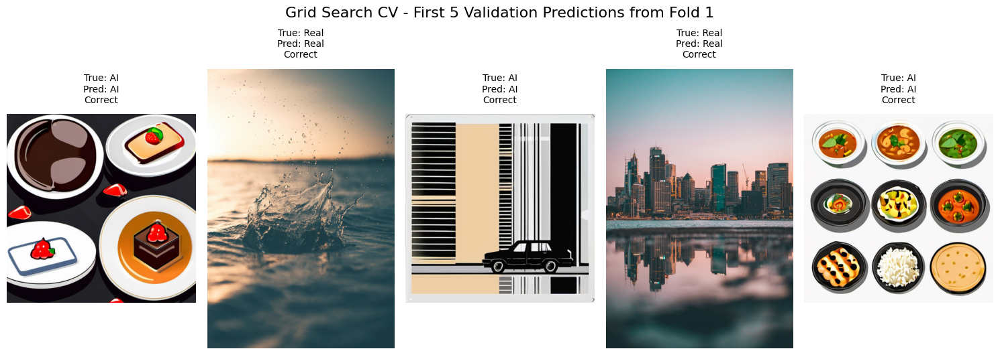

In [103]:
# Select the best configuration from the Grid Search CV results
best_cv_feature_method = best_cv_result["feature_method"]
best_cv_bins = best_cv_result["bins"]
best_cv_k = int(best_cv_result["k"])
best_cv_distance = best_cv_result["distance_metric"]

print("Best CV configuration:")
print("Feature method:", best_cv_feature_method)
print("Bins:", best_cv_bins)
print("k:", best_cv_k)
print("Distance metric:", best_cv_distance)

# Use the first fold for visualization
# Each fold contains:
# - train_indices: indices used for training
# - val_indices: indices used for validation
fold_number_to_show = 1
train_indices, val_indices = cv_folds[fold_number_to_show - 1]

# Get the precomputed feature matrix for the best feature method
cache_key = (best_cv_feature_method, best_cv_bins)

X_all = feature_cache[cache_key]["X"]
y_all = feature_cache[cache_key]["y"]

# Split the data according to the selected fold
X_train_fold = X_all[train_indices]
y_train_fold = y_all[train_indices]

X_val_fold = X_all[val_indices]
y_val_fold = y_all[val_indices]

# Create the best KNN model according to Grid Search CV
best_cv_fold_model = KNNClassifier(
    k=best_cv_k,
    distance_metric=best_cv_distance
)

# Train the model on the training part of the selected fold
best_cv_fold_model.fit(X_train_fold, y_train_fold)

# Predict the validation part of the selected fold
val_predictions = best_cv_fold_model.predict(X_val_fold)

# Create a DataFrame for the validation fold images
val_df = train_df_cv.iloc[val_indices].reset_index(drop=True)

# Display the first 5 validation predictions visually
def show_cv_validation_predictions(dataframe, y_true, y_pred, n=5, fold_number=1):
    """
    Display the first n validation images from a cross-validation fold
    with their true labels and predicted labels.
    """

    plt.figure(figsize=(15, 5))

    for i in range(n):
        row = dataframe.iloc[i]

        # Load the original image for visualization
        img = Image.open(row["filepath"]).convert("RGB")

        # Compare true label and predicted label
        is_correct = y_true[i] == y_pred[i]
        result_text = "Correct" if is_correct else "Wrong"

        plt.subplot(1, n, i + 1)
        plt.imshow(img)

        plt.title(
            f"True: {y_true[i]}\n"
            f"Pred: {y_pred[i]}\n"
            f"{result_text}",
            fontsize=10,
            pad=12
        )

        plt.axis("off")

    plt.suptitle(
        f"Grid Search CV - First {n} Validation Predictions from Fold {fold_number}",
        fontsize=16,
        y=1.05
    )

    plt.tight_layout()
    plt.show()


show_cv_validation_predictions(
    dataframe=val_df,
    y_true=y_val_fold,
    y_pred=val_predictions,
    n=5,
    fold_number=fold_number_to_show
)

In [104]:
cv_first_5_predictions = []

for i in range(5):
    cv_first_5_predictions.append({
        "fold": fold_number_to_show,
        "index_in_validation_fold": i,
        "category": val_df.iloc[i]["category"],
        "true_label": y_val_fold[i],
        "predicted_label": val_predictions[i],
        "correct": y_val_fold[i] == val_predictions[i]
    })

cv_first_5_predictions_df = pd.DataFrame(cv_first_5_predictions)

cv_first_5_predictions_df

,fold,index_in_validation_fold,category,true_label,predicted_label,correct
0,1,0,food,AI,AI,True
1,1,1,nature,Real,Real,True
2,1,2,city,AI,AI,True
3,1,3,city,Real,Real,True
4,1,4,food,AI,AI,True


### Final Selected Feature Engineering Examples

The final selected model uses Color Histogram with 32 bins.

Below, we show examples from the training set and the test set using the final selected feature engineering configuration.


Label: Real
Category: animals
Original image size: (1080, 720)
Image size after resize: (64, 64)
Number of bins per channel: 32
Final feature vector size: 96


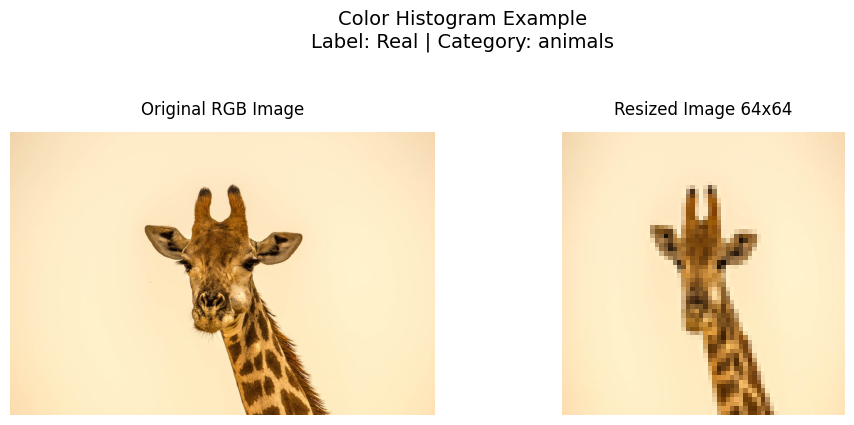

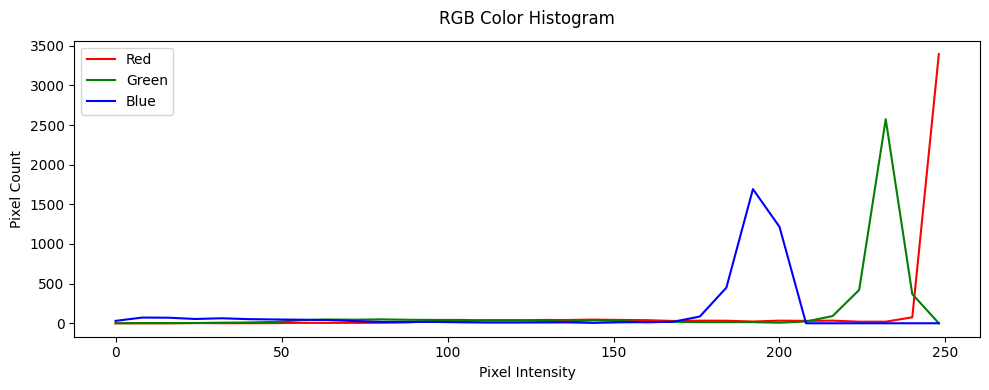


Label: Real
Category: food
Original image size: (1080, 720)
Image size after resize: (64, 64)
Number of bins per channel: 32
Final feature vector size: 96


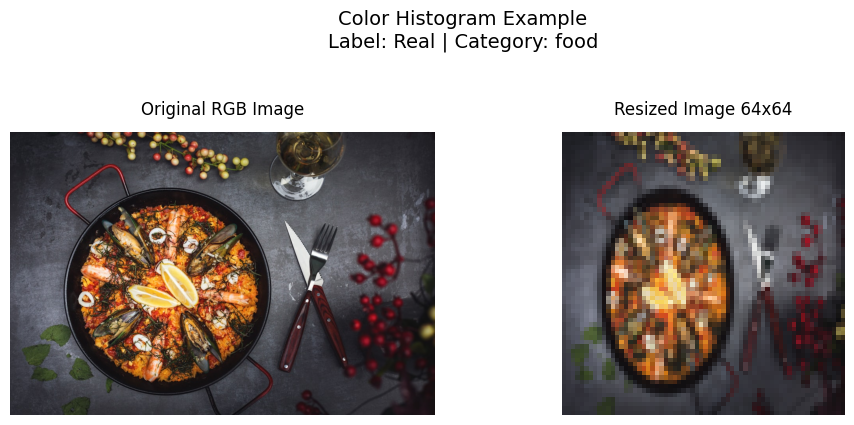

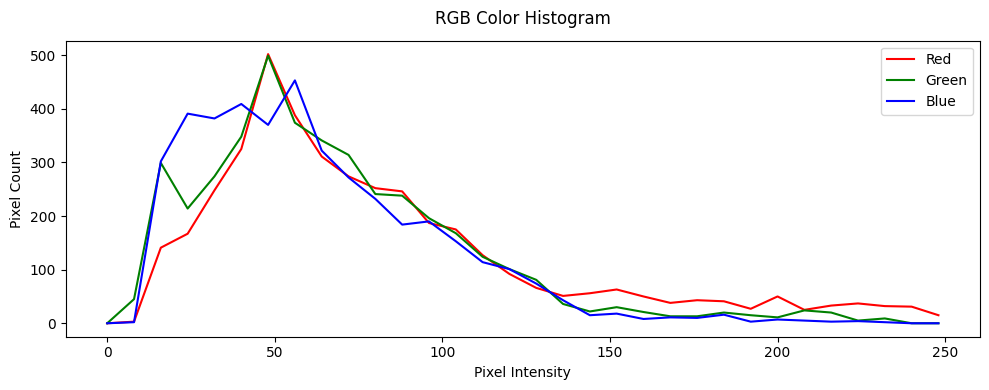


Label: Real
Category: nature
Original image size: (1080, 720)
Image size after resize: (64, 64)
Number of bins per channel: 32
Final feature vector size: 96


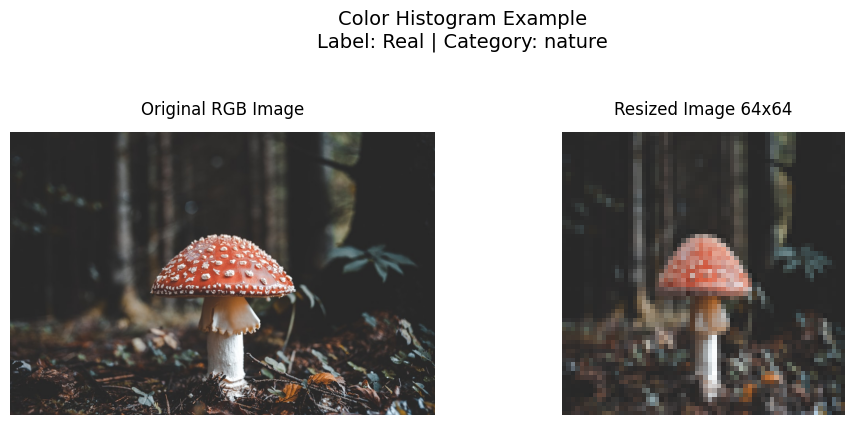

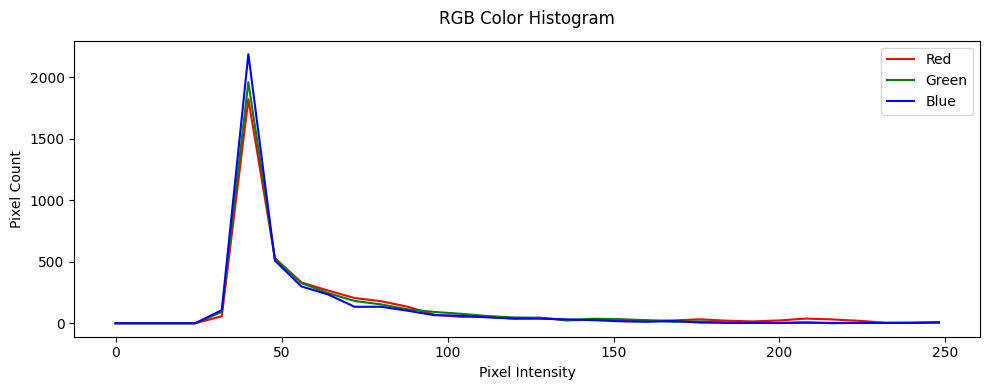


Label: Real
Category: animals
Original image size: (1080, 1620)
Image size after resize: (64, 64)
Number of bins per channel: 32
Final feature vector size: 96


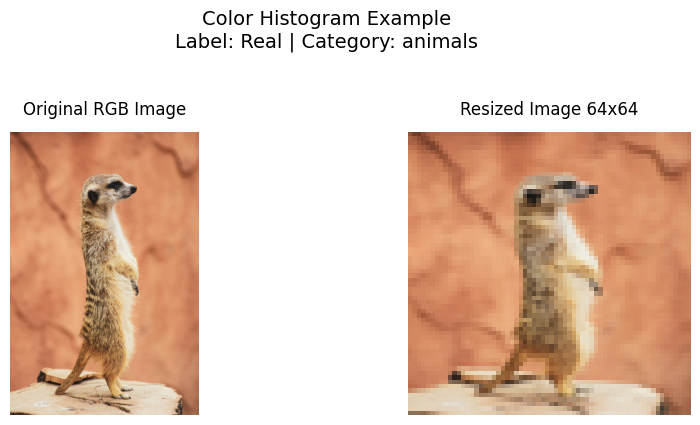

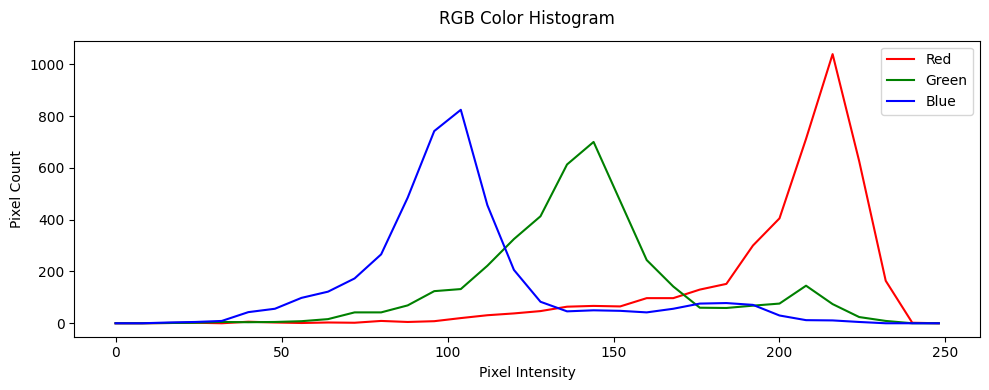

In [124]:
show_color_histogram_example(train_df, index=0, bins=32)
show_color_histogram_example(train_df, index=1, bins=32)

show_color_histogram_example(test_df, index=0, bins=32)
show_color_histogram_example(test_df, index=1, bins=32)

### 17.10 Grid Search Cross Validation Summary

In this section, we performed Grid Search with 5-Fold Cross Validation.

The grid search included:

- 4 feature engineering methods:
  - RGB Flatten
  - Grayscale Flatten
  - Color Histogram
  - Grayscale Histogram

- KNN hyperparameters:
  - k values: 1, 3, 5, 7, 9, 11
  - distance metrics: Euclidean and Manhattan

- Histogram parameters:
  - bins values: 8, 16, 32

In total, we evaluated 96 configurations.

Each configuration was evaluated using 5-fold cross validation on the training set only.

For each configuration, the model was trained and validated 5 times.  
Each time, 4 folds were used for training and 1 fold was used for validation.

The final score of each configuration is the average validation Macro F1-score across the 5 folds.

The best configuration from Grid Search CV was:

- Feature method: Color Histogram
- Image size: 64x64
- bins = 32
- k = 9
- Distance metric = Manhattan

This configuration achieved:

- Mean validation Accuracy = 0.81
- Mean validation Macro F1 = 0.8092
- Standard deviation of validation Macro F1 = 0.0440

The fold Macro F1 scores were:

- Fold 1: 0.8743
- Fold 2: 0.8125
- Fold 3: 0.8222
- Fold 4: 0.7995
- Fold 5: 0.7375

The selected configuration is different from the best exploratory test-set configuration.

In the exploratory test-set experiment, the best Color Histogram configuration used:

- bins = 8
- k = 5
- Distance metric = Manhattan

However, the final model configuration should be selected according to cross validation results, not directly according to the test set.

Therefore, the final selected model will use:

- Color Histogram
- bins = 32
- k = 9
- Distance metric = Manhattan

The test set will be used only once in the next section to evaluate the final selected model.

## 18. Train Final Model on Full Training Set

After selecting the best configuration using Grid Search Cross Validation, we train the final model on the full training set.

The final configuration is taken from `best_cv_result`.

This step does not use the test set.

The test set will be used only in the next section for the final evaluation.

### 18.1 Extracting the Best Configuration from Grid Search CV

In this step, we extract the selected feature engineering method and KNN hyperparameters from the best Grid Search CV result.

These values will define the final model configuration.

In [109]:
# Extract the best configuration selected by Grid Search CV
final_feature_method = best_cv_result["feature_method"]
final_image_size = best_cv_result["image_size"]
final_bins = best_cv_result["bins"]
final_k = int(best_cv_result["k"])
final_distance_metric = best_cv_result["distance_metric"]

print("Final selected configuration:")
print("Feature method:", final_feature_method)
print("Image size:", final_image_size)
print("Bins:", final_bins)
print("k:", final_k)
print("Distance metric:", final_distance_metric)
print("Mean validation Macro F1:", best_cv_result["mean_validation_macro_f1"])

Final selected configuration:
Feature method: Color Histogram
Image size: 64x64
Bins: 32
k: 9
Distance metric: manhattan
Mean validation Macro F1: 0.8091887086300114


### 18.2 Building Final Training Features

Now we build the feature matrix for the full training set using the selected feature engineering method.

It is important that the same feature engineering method selected by Grid Search CV is used here.

In [110]:
# Build the final training feature matrix using the selected feature method
X_train_final, y_train_final = build_features_by_method(
    train_df,
    feature_method=final_feature_method,
    bins=final_bins
)

print("X_train_final shape:", X_train_final.shape)
print("y_train_final shape:", y_train_final.shape)

X_train_final shape: (400, 96)
y_train_final shape: (400,)


### 18.3 Training the Final KNN Model

After building the final training features, we train the final KNN classifier.

In KNN, training means storing the training feature vectors and their labels.

The model will later use these stored samples to classify test images.

In [111]:
# Create the final KNN model using the best hyperparameters from Grid Search CV
final_knn = KNNClassifier(
    k=final_k,
    distance_metric=final_distance_metric
)

# Fit the final model on the full training set
final_knn.fit(X_train_final, y_train_final)

print("Final KNN model trained successfully.")
print("Feature method:", final_feature_method)
print("k:", final_k)
print("Distance metric:", final_distance_metric)

Final KNN model trained successfully.
Feature method: Color Histogram
k: 9
Distance metric: manhattan


### 18.4 Final Training Summary

The final model was trained using the best configuration selected by Grid Search Cross Validation.

The model was trained on the full training set, using the selected feature engineering method and KNN hyperparameters.

The test set was not used during this training step.

In the next section, we will evaluate the final trained model on the test set.

## 19. Final Model Evaluation on Test Set

In this section, we evaluate the final selected model on the test set.

The final model configuration was selected using Grid Search Cross Validation on the training set only.

After selecting the best configuration, we trained the final KNN model on the full training set.

Now, we apply the same feature engineering method to the test set and evaluate the final model performance.

### 19.1 Building Final Test Features

The test set must be processed using the same feature engineering method that was selected by Grid Search Cross Validation.

This ensures that the final model receives test samples in the same feature representation used during training.

In [112]:
# Build the final test feature matrix using the selected feature method
# The feature method and bins are taken from the best Grid Search CV result
X_test_final, y_test_final = build_features_by_method(
    test_df,
    feature_method=final_feature_method,
    bins=final_bins
)

print("X_test_final shape:", X_test_final.shape)
print("y_test_final shape:", y_test_final.shape)
print("Final feature method:", final_feature_method)
print("Final bins:", final_bins)

X_test_final shape: (100, 96)
y_test_final shape: (100,)
Final feature method: Color Histogram
Final bins: 32


### 19.2 Predicting the Test Set

After building the test feature matrix, we use the final trained KNN model to predict the labels of all test samples.

The output is an array of predicted labels with the same length as the test set.

In [113]:
# Predict labels for all test samples using the final trained model
final_y_pred = final_knn.predict(X_test_final)

print("Number of final test predictions:", len(final_y_pred))

print("\nFirst 20 final predictions:")
print(final_y_pred[:20])

print("\nFirst 20 true labels:")
print(y_test_final[:20])

Number of final test predictions: 100

First 20 final predictions:
['Real' 'Real' 'Real' 'AI' 'Real' 'Real' 'AI' 'AI' 'AI' 'AI' 'AI' 'AI'
 'AI' 'AI' 'Real' 'AI' 'Real' 'Real' 'AI' 'Real']

First 20 true labels:
['Real' 'Real' 'Real' 'AI' 'AI' 'AI' 'AI' 'Real' 'AI' 'AI' 'AI' 'AI'
 'Real' 'AI' 'Real' 'AI' 'Real' 'Real' 'AI' 'AI']


### 19.3 Final Prediction Distribution

Before calculating the final evaluation metrics, we compare the distribution of the predicted labels with the true label distribution.

This helps us check whether the final model is biased toward one class.

In [114]:
# Display predicted label distribution compared to true label distribution
show_prediction_distribution(
    y_test_final,
    final_y_pred
)

Prediction distribution:
AI      52
Real    48
Name: count, dtype: int64

True label distribution:
Real    50
AI      50
Name: count, dtype: int64


In [115]:
final_prediction_check_df = pd.DataFrame({
    "true_label": y_test_final,
    "predicted_label": final_y_pred,
    "correct": y_test_final == final_y_pred
})

final_prediction_check_df.head(15)

,true_label,predicted_label,correct
0,Real,Real,True
1,Real,Real,True
2,Real,Real,True
3,AI,AI,True
4,AI,Real,False
5,AI,Real,False
6,AI,AI,True
7,Real,AI,False
8,AI,AI,True
9,AI,AI,True


### 19.4 Final Evaluation Metrics

Now we calculate the final evaluation metrics on the test set.

We calculate:

- Accuracy
- Precision
- Recall
- F1-score
- Macro F1

Macro F1 is the main metric because this is a binary classification problem where both classes are important.

In [116]:
# Calculate final evaluation metrics
final_accuracy, final_macro_f1, final_metrics_df = calculate_classification_metrics(
    y_test_final,
    final_y_pred,
    labels
)

print("Final Test Accuracy:", final_accuracy)
print("Final Test Macro F1:", final_macro_f1)

final_metrics_df

Final Test Accuracy: 0.84
Final Test Macro F1: 0.8399359743897559


,class,TP,FP,FN,precision,recall,f1_score
0,AI,43,9,7,0.826923,0.86,0.843137
1,Real,41,7,9,0.854167,0.82,0.836735


### 19.5 Final Confusion Matrix

The final confusion matrix shows how the selected model performed on the test set.

Rows represent the true labels.  
Columns represent the predicted labels.

In [117]:
# Build final confusion matrix
final_confusion_df = confusion_matrix_from_scratch(
    y_test_final,
    final_y_pred,
    labels
)

final_confusion_df

,Predicted AI,Predicted Real
True AI,43,7
True Real,9,41


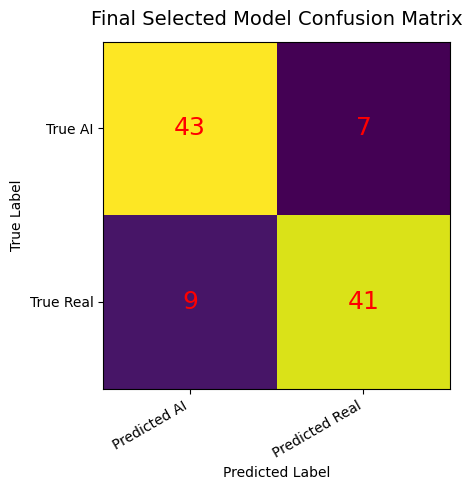

In [118]:
plot_confusion_matrix(
    final_confusion_df,
    title="Final Selected Model Confusion Matrix"
)

### 19.6 First Five Final Test Predictions

The assignment requires showing the first five predictions on the test set.

In this section, we display the first five predictions of the final selected model.

For each image, we show:

- the true label
- the predicted label
- whether the prediction was correct

In [119]:
final_first_5_predictions = []

for i in range(5):
    final_first_5_predictions.append({
        "index": i,
        "category": test_df.iloc[i]["category"],
        "true_label": y_test_final[i],
        "predicted_label": final_y_pred[i],
        "correct": y_test_final[i] == final_y_pred[i]
    })

final_first_5_predictions_df = pd.DataFrame(final_first_5_predictions)

final_first_5_predictions_df

,index,category,true_label,predicted_label,correct
0,0,nature,Real,Real,True
1,1,animals,Real,Real,True
2,2,food,Real,Real,True
3,3,people,AI,AI,True
4,4,people,AI,Real,False


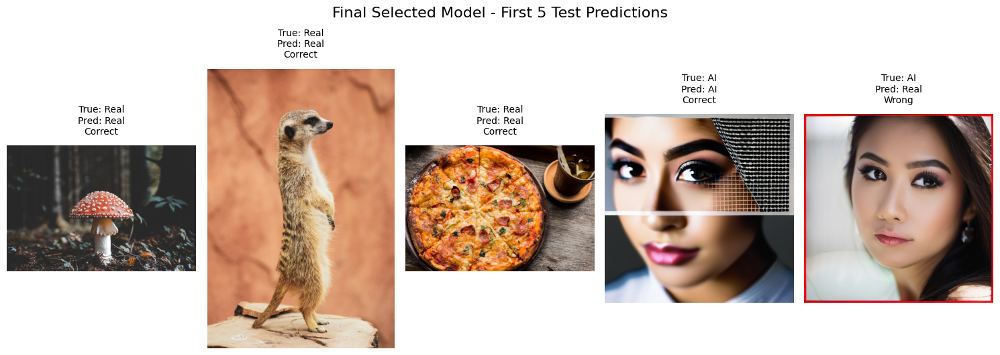

In [120]:
show_predictions(
    test_df,
    y_test_final,
    final_y_pred,
    n=5,
    title="Final Selected Model - First 5 Test Predictions"
)

### 19.7 Storing the Final Model Result

We store the final selected model result in the general experiment results list.

Unlike the previous exploratory experiments, this result comes from the model selected by Grid Search Cross Validation and evaluated once on the test set.

In [122]:
final_model_result = {
    "experiment": "Final Selected Model",
    "feature_method": final_feature_method,
    "image_size": final_image_size,
    "bins": final_bins,
    "k": final_k,
    "distance_metric": final_distance_metric,
    "accuracy": final_accuracy,
    "macro_f1": final_macro_f1
}

# Remove previous final model result if it exists
experiments_results = [
    result for result in experiments_results
    if result["experiment"] != "Final Selected Model"
]

# Add the final selected model result
experiments_results.append(final_model_result)

final_results_df = pd.DataFrame(experiments_results)

final_results_df

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1
0,Baseline KNN,RGB Flatten,32x32,Not used,3,euclidean,0.48,0.340436
1,Best RGB Flatten KNN,RGB Flatten,32x32,Not used,1,manhattan,0.62,0.582418
2,Best Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,1,manhattan,0.58,0.532086
3,Best Color Histogram KNN,Color Histogram,64x64,8,5,manhattan,0.86,0.859776
4,Best Grayscale Histogram KNN,Grayscale Histogram,64x64,32,11,manhattan,0.80,0.799920
5,Final Selected Model,Color Histogram,64x64,32,9,manhattan,0.84,0.839936


### 19.8 Final Model Evaluation Summary

In this section, we evaluated the final selected model on the test set.

The final model was selected using Grid Search Cross Validation on the training set only.

The selected configuration was:

- Feature method: Color Histogram
- Image size: 64x64
- bins = 32
- k = 9
- Distance metric = Manhattan

After training the final model on the full training set, we evaluated it once on the test set.

The final model achieved:

- Test Accuracy = 0.84
- Test Macro F1 = 0.8399

The prediction distribution was almost balanced:

- 52 samples were predicted as `AI`
- 48 samples were predicted as `Real`

The confusion matrix shows that the model correctly classified:

- 43 out of 50 AI-generated images
- 41 out of 50 real images

The model performed well on both classes:

- AI F1-score = 0.8431
- Real F1-score = 0.8367

This shows that the final model is not strongly biased toward one class.

Compared to the baseline model, the final selected model improved significantly:

- Accuracy improved from 0.48 to 0.84
- Macro F1 improved from 0.3404 to 0.8399

This final evaluation is the most important test-set result in the project, because the test set was not used to select the final model configuration.

Overall, the results show that Color Histogram combined with KNN and selected through Grid Search Cross Validation provides a strong solution for distinguishing between AI-generated and real images in this dataset.

## 20. Final Experiment Comparison

In this section, we compare the main experimental results from the project.

The comparison includes:

- the baseline model
- the best exploratory test-set results for each feature engineering method
- the final selected model chosen by Grid Search Cross Validation

This comparison helps us understand how feature engineering and hyperparameter tuning affected the model performance.

### 20.1 Final Results Table

The following table summarizes the main experiment results.

It includes both exploratory test-set experiments and the final selected model.

In [123]:
final_results_df = pd.DataFrame(experiments_results)

final_results_df = final_results_df.sort_values(
    by="macro_f1",
    ascending=False
).reset_index(drop=True)

final_results_df

,experiment,feature_method,image_size,bins,k,distance_metric,accuracy,macro_f1
0,Best Color Histogram KNN,Color Histogram,64x64,8,5,manhattan,0.86,0.859776
1,Final Selected Model,Color Histogram,64x64,32,9,manhattan,0.84,0.839936
2,Best Grayscale Histogram KNN,Grayscale Histogram,64x64,32,11,manhattan,0.80,0.799920
3,Best RGB Flatten KNN,RGB Flatten,32x32,Not used,1,manhattan,0.62,0.582418
4,Best Grayscale Flatten KNN,Grayscale Flatten,32x32,Not used,1,manhattan,0.58,0.532086
5,Baseline KNN,RGB Flatten,32x32,Not used,3,euclidean,0.48,0.340436


### 20.2 Important Note About the Final Results Table

The table includes both exploratory test-set experiments and the final selected model.

The exploratory experiments were useful for comparing feature engineering methods and understanding the behavior of different KNN configurations.

However, the final model was not selected directly from the exploratory test-set experiments.

Instead, the final model was selected using Grid Search Cross Validation on the training set only.

Therefore, the `Final Selected Model` is the main result of the project, even if one exploratory test-set experiment achieved a slightly higher test Macro F1-score.

This is because the final selected model follows the correct machine learning evaluation process:

1. Model selection using cross-validation on the training set.
2. Training the final model on the full training set.
3. Evaluating the final model once on the test set.

### 20.3 Final Experiment Comparison Summary

The baseline model used RGB Flatten features with KNN and achieved low performance.

After testing additional feature engineering methods, the histogram-based representations performed much better than raw flattened pixel representations.

The best exploratory test-set result was achieved by the Color Histogram method.

However, the final selected model was chosen using Grid Search Cross Validation, not directly from the exploratory test-set experiments.

The final selected model also used Color Histogram features, which supports the conclusion that color distribution is a useful representation for distinguishing between AI-generated and real images.

Overall, the comparison shows that feature engineering had a major impact on model performance.

## 21. Final Conclusion

In this project, we built a supervised machine learning pipeline for classifying images as either AI-generated or real.

We started with an imbalanced dataset that we balanced into 500 images:

- 250 AI-generated images
- 250 real images

The dataset was split into 400 training images and 100 test images.

We implemented the KNN algorithm from scratch and tested several feature engineering methods:

- RGB Flatten
- Grayscale Flatten
- Color Histogram
- Grayscale Histogram

The baseline model used RGB Flatten with KNN and achieved weak performance:

- Accuracy = 0.48
- Macro F1 = 0.3404

After testing different feature engineering methods and KNN hyperparameters, the histogram-based methods performed much better than the raw flattened pixel methods.

To choose the final model correctly, we used Grid Search with 5-Fold Cross Validation on the training set only.

The final selected model was:

- Feature method: Color Histogram
- bins = 32
- k = 9
- Distance metric = Manhattan

After training the final model on the full training set and evaluating it once on the test set, it achieved:

- Test Accuracy = 0.84
- Test Macro F1 = 0.8399

The main conclusion of this project is that the choice of feature representation has a strong effect on model performance.

For the AI-generated vs real image classification task, Color Histogram features combined with KNN provided a much stronger result than raw flattened pixels.

This confirms that effective feature engineering is essential when using traditional machine learning algorithms for image classification.